In [275]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [276]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Some basic functions

**Function to plot Cumulative variance ratio**

In [277]:
def plot_cumulative_variance_ratio(S, threshold=0.95):
    # explained variance ratio
    explained_variance_ratio = (S ** 2) / np.sum(S ** 2)

    # cumulative explained variance ratio
    cumulative_variance_ratio = np.cumsum(explained_variance_ratio)

    # Plotting cumulative explained variance ratio
    plt.plot(range(1, len(cumulative_variance_ratio) + 1), cumulative_variance_ratio, marker='o', linestyle='-')
    plt.xlabel('Number of Singular Values (k)')
    plt.ylabel('Cumulative Explained Variance Ratio')
    plt.title('Cumulative Explained Variance Ratio vs. Number of Singular Values')
    plt.grid(True)

    # smallest k that captures the 95%
    k_threshold = np.argmax(cumulative_variance_ratio >= threshold) + 1

    # Plot the arrow
    plt.scatter(k_threshold, threshold, color='red', label=f'{int(threshold*100)}% Threshold')
    plt.annotate(f'({k_threshold}, {threshold})', xy=(k_threshold, threshold), xytext=(k_threshold + 10, threshold - 0.05),
                 arrowprops=dict(facecolor='black', arrowstyle='->'),)

    plt.legend()
    plt.show()

    print(f"The smallest k that captures {int(threshold*100)}% of the total variance: {k_threshold}")

    return k_threshold

**Function to plot energy contribution for first 10 modes**

In [278]:
def plot_energy_contribution_first_10_modes(energy_first_10_modes, total_energy):
    # % energy contribution by 10 modes
    percentage_energy_first_10_modes = (energy_first_10_modes / total_energy) * 100
    nonzero_indices = np.nonzero(percentage_energy_first_10_modes)
    percentage_energy_first_10_modes = percentage_energy_first_10_modes[nonzero_indices]

    # Plotting each value of enregy for 10 modes.
    plt.figure(figsize=(10, 6))
    plt.plot(range(1, len(percentage_energy_first_10_modes) + 1), percentage_energy_first_10_modes, marker='o', color='red', linestyle='-')
    plt.xlabel('Mode')
    plt.ylabel('Percentage of Total Energy')
    plt.title('Energy Contribution of First 10 Modes')
    plt.xticks(range(1, len(percentage_energy_first_10_modes) + 1))
    plt.grid(True)

    for i, (x, y) in enumerate(zip(range(1, len(percentage_energy_first_10_modes) + 1), percentage_energy_first_10_modes)):
        plt.text(x, y, f'({x},{y:.2f})', ha='right')

    plt.show()

**Function for loading and stacking of images**

In [279]:
def load_and_preprocess_images(folder_path):
    images = []
    for filename in sorted(os.listdir(folder_path)):
        if filename.endswith(".jpg"):
            image_path = os.path.join(folder_path, filename)
            image = cv2.imread(image_path)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
            images.append(image)
    return images

def stack_images(images):
    stacked_images = np.array([image.flatten() for image in images])
    return stacked_images

#3.1 Image Generation

Total frames extracted: 75


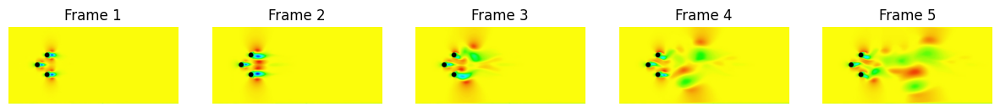

In [280]:
# video file path
video_path = "/content/drive/MyDrive/3CYL_Flow.mp4"
cap = cv2.VideoCapture(video_path)

# directory to save the frames
output_dir = "frames"
os.makedirs(output_dir, exist_ok=True)

# saving every 10th frames
frame_count = 0
saved_frame_count = 0
plt.figure(figsize=(15, 3))
while(cap.isOpened()):
    ret, frame = cap.read()
    if ret == False:
        break
    frame_count += 1
    if frame_count % 10 == 0:  # 10th frame
        saved_frame_count += 1
        frame_filename = os.path.join(output_dir, f"frame_{saved_frame_count:04d}.jpg")
        cv2.imwrite(frame_filename, frame)
        # printing some frames
        if saved_frame_count <= 5:
            plt.subplot(1, 5, saved_frame_count)
            plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
            plt.title(f"Frame {saved_frame_count}")
            plt.axis("off")

cap.release()

print(f"Total frames extracted: {saved_frame_count}")

plt.show()

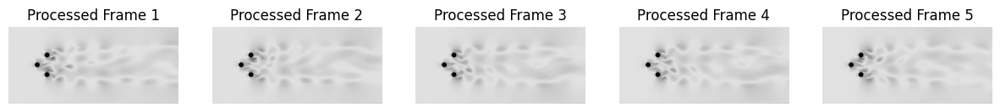

In [281]:
def preprocess_image(image):
    grayscale_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    blurred_image = cv2.GaussianBlur(grayscale_image, (5, 5), 0)  # Specify kernel size

    return blurred_image

input_dir = "/content/frames"
output_dir = "processed_frames"
os.makedirs(output_dir, exist_ok=True)

image_files = sorted(os.listdir(input_dir), key=lambda x: int(x.split('_')[1].split('.')[0]))
for filename in image_files:
    if filename.endswith(".jpg"):
        image_path = os.path.join(input_dir, filename)

        frame = cv2.imread(image_path)

        processed_frame = preprocess_image(frame)

        output_path = os.path.join(output_dir, filename)
        cv2.imwrite(output_path, processed_frame)

sample_images = os.listdir(output_dir)[:5]
plt.figure(figsize=(15, 3))
for i, filename in enumerate(sample_images):
    image_path = os.path.join(output_dir, filename)
    image = cv2.imread(image_path)
    plt.subplot(1, 5, i+1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(f"Processed Frame {i+1}")
    plt.axis("off")

plt.show()

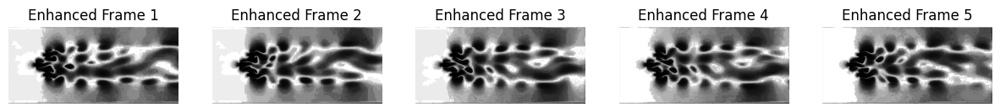

In [282]:
def enhance_image(image):
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    equalized_image = cv2.equalizeHist(gray_image)

    return equalized_image

input_dir = "/content/frames"
output_dir = "enhanced_frames"
os.makedirs(output_dir, exist_ok=True)

for filename in os.listdir(input_dir):
    if filename.endswith(".jpg"):
        image_path = os.path.join(input_dir, filename)
        frame = cv2.imread(image_path)

        enhanced_frame = enhance_image(frame)

        output_path = os.path.join(output_dir, filename)
        cv2.imwrite(output_path, enhanced_frame)

sample_images = os.listdir(output_dir)[:5]
plt.figure(figsize=(15, 3))
for i, filename in enumerate(sample_images):
    image_path = os.path.join(output_dir, filename)
    image = cv2.imread(image_path)
    plt.subplot(1, 5, i+1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(f"Enhanced Frame {i+1}")
    plt.axis("off")

plt.show()

# Execute POD

In [283]:
# Folder containing the frames
folder_path = "/content/frames"

# Loading and preprocessing the images
images = load_and_preprocess_images(folder_path)
print("Image shape is (H, W)", images[0].shape)
images

Image shape is (H, W) (708, 1558)


[array([[212, 212, 212, ..., 213, 213, 213],
        [218, 218, 218, ..., 219, 219, 219],
        [224, 224, 224, ..., 223, 223, 223],
        ...,
        [222, 222, 222, ..., 214, 214, 214],
        [212, 212, 212, ..., 204, 204, 204],
        [207, 207, 207, ..., 198, 198, 198]], dtype=uint8),
 array([[211, 211, 211, ..., 208, 208, 208],
        [218, 218, 218, ..., 214, 214, 214],
        [224, 223, 224, ..., 218, 218, 218],
        ...,
        [222, 221, 222, ..., 210, 210, 210],
        [212, 212, 212, ..., 201, 201, 201],
        [205, 205, 205, ..., 193, 193, 193]], dtype=uint8),
 array([[211, 211, 211, ..., 206, 206, 206],
        [219, 219, 219, ..., 209, 209, 209],
        [225, 225, 225, ..., 214, 214, 214],
        ...,
        [222, 221, 222, ..., 206, 206, 206],
        [212, 212, 212, ..., 199, 199, 199],
        [205, 205, 205, ..., 193, 193, 193]], dtype=uint8),
 array([[211, 211, 211, ..., 203, 203, 203],
        [220, 220, 220, ..., 208, 208, 208],
        [225, 22

In [284]:
# Stack images into a matrix
stacked_images = stack_images(images)
print(stacked_images)
print(f'Shape of stacked images matrix: {stacked_images.shape}')

[[212 212 212 ... 198 198 198]
 [211 211 211 ... 193 193 193]
 [211 211 211 ... 193 193 193]
 ...
 [209 209 209 ... 181 181 181]
 [212 212 212 ... 183 183 183]
 [209 209 209 ... 183 183 183]]
Shape of stacked images matrix: (75, 1103064)


In [285]:
# mean image
mean_image = np.mean(stacked_images, axis=0)
print(mean_image)
print("Mena image shape ",mean_image.shape)

[210.65333333 210.65333333 210.52       ... 183.65333333 183.56
 183.53333333]
Mena image shape  (1103064,)


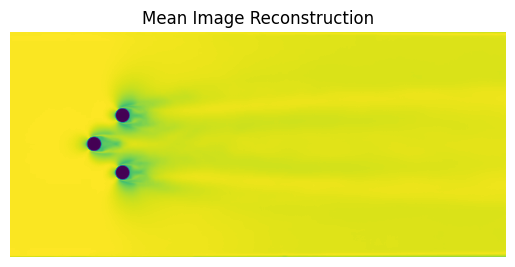

In [286]:
# Reshaped to its original shape
mean_image_reshaped = mean_image.reshape(images[0].shape)

plt.imshow(mean_image_reshaped)
plt.title('Mean Image Reconstruction')
plt.axis('off')
plt.show()

In [287]:
# Subtract mean image from each image
mean_subtracted_images = stacked_images - mean_image
print(mean_subtracted_images)
print("Mean image shape",mean_subtracted_images.shape)

[[ 1.34666667  1.34666667  1.48       ... 14.34666667 14.44
  14.46666667]
 [ 0.34666667  0.34666667  0.48       ...  9.34666667  9.44
   9.46666667]
 [ 0.34666667  0.34666667  0.48       ...  9.34666667  9.44
   9.46666667]
 ...
 [-1.65333333 -1.65333333 -1.52       ... -2.65333333 -2.56
  -2.53333333]
 [ 1.34666667  1.34666667  1.48       ... -0.65333333 -0.56
  -0.53333333]
 [-1.65333333 -1.65333333 -1.52       ... -0.65333333 -0.56
  -0.53333333]]
Mean image shape (75, 1103064)


In [288]:
# Singular Value Decomposition
U, S, Vt = np.linalg.svd(mean_subtracted_images, full_matrices=False)
print(U)
print("spatial modes ",U.shape)
print(S)
print("singular values ",S.shape)
print(Vt)
print("temporal coefficients ",Vt.shape)

[[ 1.80945619e-02 -1.81109373e-01  2.80053317e-01 ... -9.38260796e-03
  -1.55750686e-02 -1.15470054e-01]
 [ 3.97113540e-02 -2.95942527e-01  3.79917360e-01 ... -2.62961199e-04
  -1.37766372e-04 -1.15470054e-01]
 [ 1.77165277e-01 -7.05132663e-02  4.59604738e-01 ... -4.58689123e-03
   2.37533219e-03 -1.15470054e-01]
 ...
 [-7.36600499e-02 -1.53858171e-01 -1.03151117e-01 ... -9.88242158e-02
   1.37877785e-01 -1.15470054e-01]
 [-1.54549665e-01 -8.53005106e-02  6.40246510e-02 ... -2.09271405e-01
   5.10800095e-01 -1.15470054e-01]
 [-1.90514850e-01  6.30861995e-02  5.52655338e-02 ...  3.51582622e-01
   4.37318625e-01 -1.15470054e-01]]
spatial modes  (75, 75)
[2.23402193e+04 2.00569557e+04 1.92008161e+04 1.83792800e+04
 1.65261865e+04 1.55790786e+04 1.51114812e+04 1.37532381e+04
 1.33070016e+04 1.29414286e+04 1.23672135e+04 1.18344711e+04
 1.14165082e+04 1.07593664e+04 1.03881717e+04 9.68912113e+03
 9.32776866e+03 8.69376524e+03 8.38469454e+03 8.24717632e+03
 8.00007746e+03 7.65379543e+03 7.48

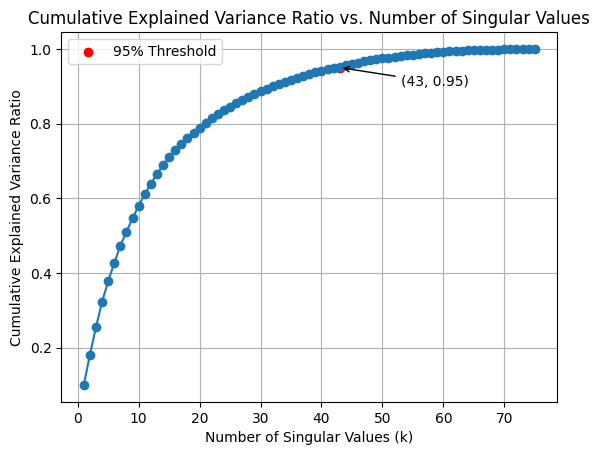

The smallest k that captures 95% of the total variance: 43


In [289]:
k_threshold = plot_cumulative_variance_ratio(S)

In [290]:
def reduce_dimensions(U, S, Vt, k):
    U_reduced = U[:, :k]
    print('Shape of U after dim reduction ',U_reduced.shape)
    S_reduced = np.diag(S[:k])
    print('Shape of S after dim reduction ',S_reduced.shape)
    Vt_reduced = Vt[:k, :]
    print('Shape of Vt after dim reduction ',Vt_reduced.shape)

    return U_reduced, S_reduced, Vt_reduced


U_reduced, S_reduced, Vt_reduced= reduce_dimensions(U, S, Vt, k_threshold)


Shape of U after dim reduction  (75, 43)
Shape of S after dim reduction  (43, 43)
Shape of Vt after dim reduction  (43, 1103064)


In [291]:
reconstructed_images = U_reduced @ S_reduced @ Vt_reduced + mean_image
print(reconstructed_images)
reconstructed_images.shape

[[211.17024909 211.17024909 210.88009797 ... 197.41976608 197.41828153
  197.43588886]
 [211.33305673 211.33305674 211.45037119 ... 193.49674237 193.46201654
  193.42606223]
 [210.89757556 210.89757556 210.88528819 ... 192.65113128 192.67430559
  192.70112269]
 ...
 [210.47606765 210.47606765 210.61435555 ... 181.53262422 181.47991369
  181.48801989]
 [211.59848895 211.59848895 211.45262902 ... 185.05393111 185.05652546
  185.12758295]
 [208.69371811 208.69371811 208.96423669 ... 183.31121112 183.10324419
  183.08923677]]


(75, 1103064)

# 3.3 Analyse POD Modes

*Here these 10 images are showing the top 10 flow mode which have the higheset energy among all the modes.

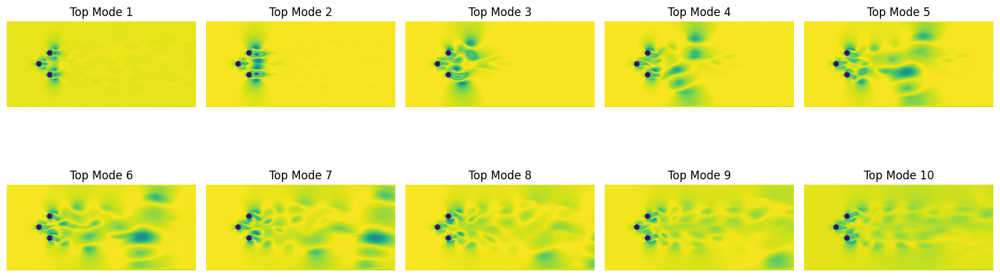

In [292]:
plt.figure(figsize=(15, 6))
for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.imshow(reconstructed_images[i].reshape(images[0].shape), cmap=None)
    plt.title(f"Top Mode {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()


*This is showing the total energy and percentage of total energy possesed by these 10 modes only.*

In [293]:
# Total Energy of all modes
total_energy = np.sum(S_reduced ** 2)

# Total Energy of 10 modes
total_energy_top_10_modes = np.sum(S_reduced[:10] ** 2)

# % Contribution by 10 modes in total energy
percentage_energy_top_10_modes = (total_energy_top_10_modes / total_energy) * 100
print(f"Total energy: {total_energy}")
print(f"Sum of top 10 singular values: {total_energy_top_10_modes}")
print(f"Percentage of total energy contribution by the top 10 modes: {percentage_energy_top_10_modes:.2f}%")

Total energy: 4740025239.168307
Sum of top 10 singular values: 2885723958.9768953
Percentage of total energy contribution by the top 10 modes: 60.88%


*Percentage of energy by each top 10 modes.*

In [294]:
# Individual energy of 10 modes
energy_first_10_modes = (S_reduced[:10] ** 2)
total_energy = np.sum(S_reduced ** 2)


for i, energy in enumerate(energy_first_10_modes, start=1):
    energy_contribution = ((energy / total_energy) * 100)[i-1]
    print(f"Energy contribution of mode {i}: {energy_contribution:.2f}%")


Energy contribution of mode 1: 10.53%
Energy contribution of mode 2: 8.49%
Energy contribution of mode 3: 7.78%
Energy contribution of mode 4: 7.13%
Energy contribution of mode 5: 5.76%
Energy contribution of mode 6: 5.12%
Energy contribution of mode 7: 4.82%
Energy contribution of mode 8: 3.99%
Energy contribution of mode 9: 3.74%
Energy contribution of mode 10: 3.53%


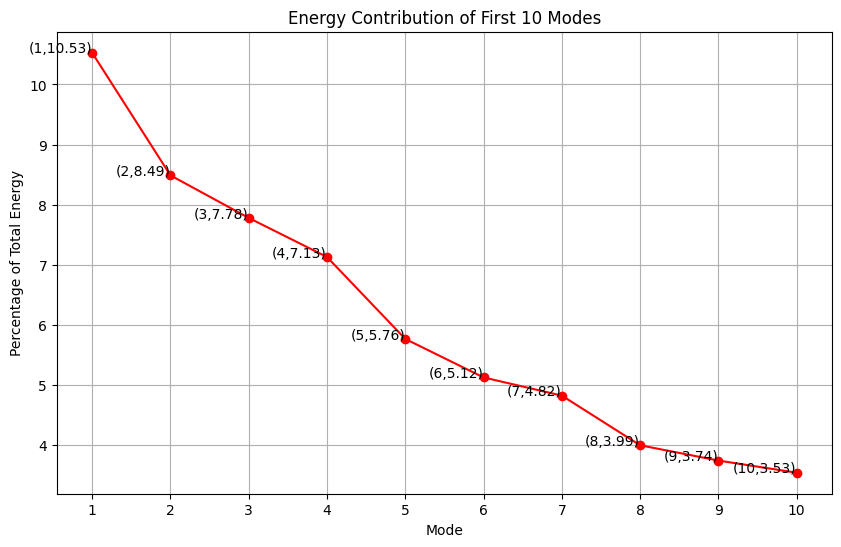

In [295]:
plot_energy_contribution_first_10_modes(energy_first_10_modes, total_energy)

# 4.1 Adding Noise

**Some basic functions to add noise**

In [296]:
def add_gaussian_noise(image, magnitude):
    mean = 0
    std_dev = magnitude * 255 / 100
    noisy_image = image.copy()
    cv2.randn(noisy_image, mean, std_dev)
    noisy_image = cv2.add(image, noisy_image)
    return np.clip(noisy_image, 0, 255).astype(np.uint8)


In [297]:
def display_images(folder_path, image_prefix, num_images=5):
    plt.figure(figsize=(20, 3))
    for i in range(1, num_images+1):
        image_path = os.path.join(folder_path, f"{image_prefix}_{i:04d}.jpg")
        image = cv2.imread(image_path)
        plt.subplot(1, num_images, i)
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.title(f"Image {i}")
        plt.axis('off')
    plt.show()


In [298]:
def add_noise_to_frames(original_frames_folder, noise_folder, magnitude):

    os.makedirs(noise_folder, exist_ok=True)

    for filename in os.listdir(original_frames_folder):
        if filename.endswith(".jpg"):
            original_frame_path = os.path.join(original_frames_folder, filename)
            original_frame = cv2.imread(original_frame_path)

            noisy_frame = add_gaussian_noise(original_frame, magnitude) # gaussian noise

            noisy_frame_filename = f"noise_{magnitude}_{filename}"
            cv2.imwrite(os.path.join(noise_folder, noisy_frame_filename), noisy_frame)

    print(f"{magnitude}% Gaussian noise added to frames and saved in the '{noise_folder}' folder.")


# Adding Gaussian Noise

**Adding 20% noise**

20% Gaussian noise added to frames and saved in the '/content/noise_20' folder.


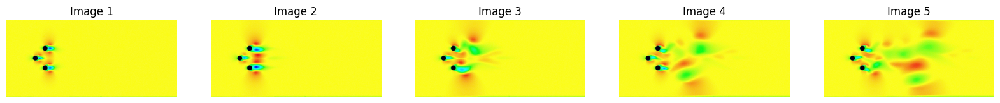

In [299]:
original_frames_folder = "/content/frames"
noise_folder = "/content/noise_20"
magnitude = 20

add_noise_to_frames(original_frames_folder, noise_folder, magnitude)

noisy_frames_folder = "/content/noise_20"
image_prefix = "noise_20_frame"

display_images(noisy_frames_folder, image_prefix)


**Adding 40% noise**

40% Gaussian noise added to frames and saved in the '/content/noise_40' folder.


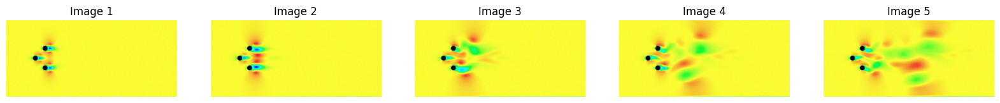

In [300]:
original_frames_folder = "/content/frames"
noise_folder = "/content/noise_40"
magnitude = 40

add_noise_to_frames(original_frames_folder, noise_folder, magnitude)

noisy_frames_folder = "/content/noise_40"
image_prefix = "noise_40_frame"

display_images(noisy_frames_folder, image_prefix)


**Adding 60% noise**

60% Gaussian noise added to frames and saved in the '/content/noise_60' folder.


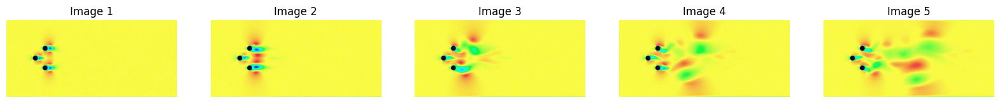

In [301]:
original_frames_folder = "/content/frames"
noise_folder = "/content/noise_60"
magnitude = 60

add_noise_to_frames(original_frames_folder, noise_folder, magnitude)

noisy_frames_folder = "/content/noise_60"
image_prefix = "noise_60_frame"

display_images(noisy_frames_folder, image_prefix)


**Adding 80% noise**

80% Gaussian noise added to frames and saved in the '/content/noise_80' folder.


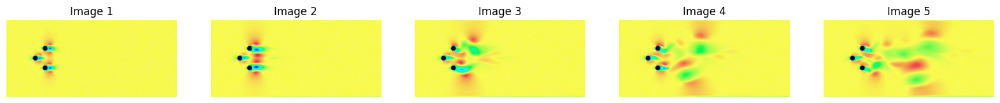

In [302]:
original_frames_folder = "/content/frames"
noise_folder = "/content/noise_80"
magnitude = 80

add_noise_to_frames(original_frames_folder, noise_folder, magnitude)

noisy_frames_folder = "/content/noise_80"
image_prefix = "noise_80_frame"

display_images(noisy_frames_folder, image_prefix)


# Adding speckle noise

*Some basic functions*

In [303]:
def add_speckle_noise(image, magnitude):

    # standard deviation
    std_dev = magnitude * 255 / 100

    # random noise with the same size as the input image
    noise = np.random.randn(*image.shape) * std_dev
    # adding noise to image
    noisy_image = image + image * noise

    return np.clip(noisy_image, 0, 255).astype(np.uint8) #limit the pixel value of noise

In [304]:
def add_noise_to_frames(original_frames_folder, noise_folder, magnitude):

    os.makedirs(noise_folder, exist_ok=True)

    for filename in os.listdir(original_frames_folder):
        if filename.endswith(".jpg"):
            original_frame_path = os.path.join(original_frames_folder, filename)
            original_frame = cv2.imread(original_frame_path)

            noisy_frame = add_speckle_noise(original_frame, magnitude) # add pickle noise

            noisy_frame_filename = f"noise_{magnitude}_{filename}"
            cv2.imwrite(os.path.join(noise_folder, noisy_frame_filename), noisy_frame)

    print(f"{magnitude}% Speckle noise added to frames and saved in the '{noise_folder}' folder.")


20% Speckle noise added to frames and saved in the '/content/noise_speckle_20' folder.


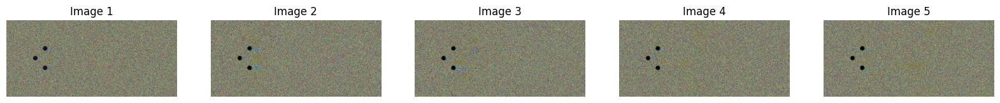

In [305]:
original_frames_folder = "/content/frames"
noise_folder = "/content/noise_speckle_20"
magnitude = 20

add_noise_to_frames(original_frames_folder, noise_folder, magnitude)

noisy_frames_folder = "/content/noise_speckle_20"
image_prefix = "noise_20_frame"

display_images(noisy_frames_folder, image_prefix)


40% Speckle noise added to frames and saved in the '/content/noise_speckle_40' folder.


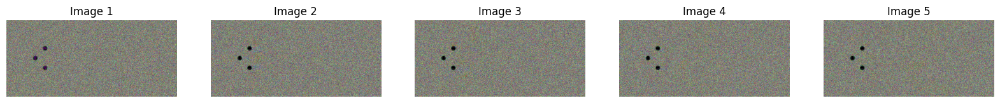

In [306]:
original_frames_folder = "/content/frames"
noise_folder = "/content/noise_speckle_40"
magnitude = 40

add_noise_to_frames(original_frames_folder, noise_folder, magnitude)

noisy_frames_folder = "/content/noise_speckle_40"
image_prefix = "noise_40_frame"

display_images(noisy_frames_folder, image_prefix)


60% Speckle noise added to frames and saved in the '/content/noise_speckle_60' folder.


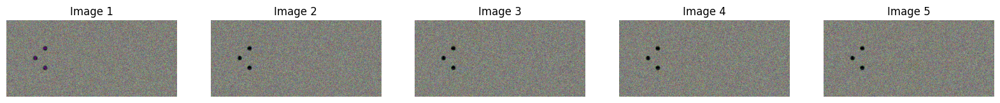

In [307]:
original_frames_folder = "/content/frames"
noise_folder = "/content/noise_speckle_60"
magnitude = 60

add_noise_to_frames(original_frames_folder, noise_folder, magnitude)

noisy_frames_folder = "/content/noise_speckle_60"
image_prefix = "noise_60_frame"

display_images(noisy_frames_folder, image_prefix)


80% Speckle noise added to frames and saved in the '/content/noise_speckle_80' folder.


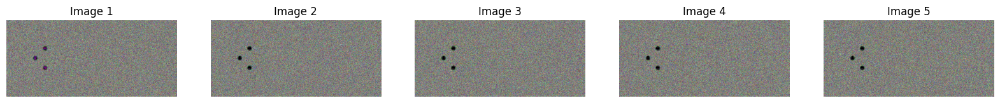

In [308]:
original_frames_folder = "/content/frames"
noise_folder = "/content/noise_speckle_80"
magnitude = 80

add_noise_to_frames(original_frames_folder, noise_folder, magnitude)

noisy_frames_folder = "/content/noise_speckle_80"
image_prefix = "noise_80_frame"

display_images(noisy_frames_folder, image_prefix)


# 4.2 Effect on POD Modes

# POD for Gaussian added noise

**POD for 20% noised image**

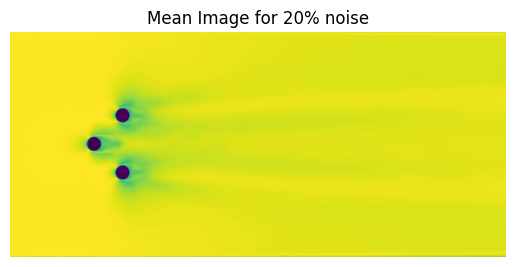

In [309]:
stacked_images = stack_images(images)

mean_image = np.mean(stacked_images, axis=0)

mean_image_reshaped = mean_image.reshape(images[0].shape)

plt.imshow(mean_image_reshaped)
plt.title('Mean Image for 20% noise')
plt.axis('off')
plt.show()

mean_subtracted_images = stacked_images - mean_image

U, S, Vt = np.linalg.svd(mean_subtracted_images, full_matrices=False)

num_modes = 10
dominant_modes = Vt[:num_modes, :]

temporal_coefficients = np.dot(dominant_modes, mean_subtracted_images.T)

reconstructed_images = np.dot(temporal_coefficients.T, dominant_modes) + mean_image

folder_path = "/content/noise_20"

images = load_and_preprocess_images(folder_path)


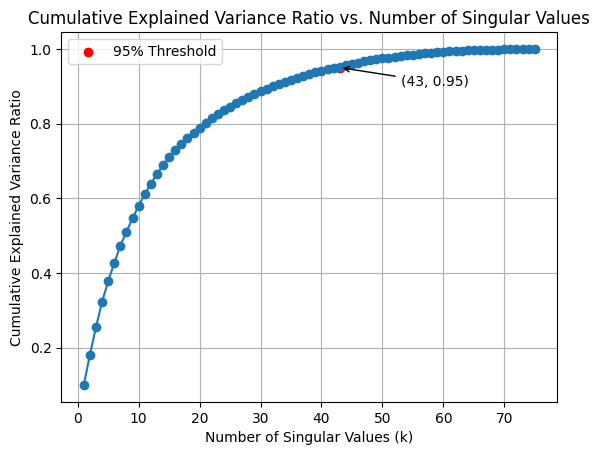

The smallest k that captures 95% of the total variance: 43


In [310]:
k_threshold = plot_cumulative_variance_ratio(S)

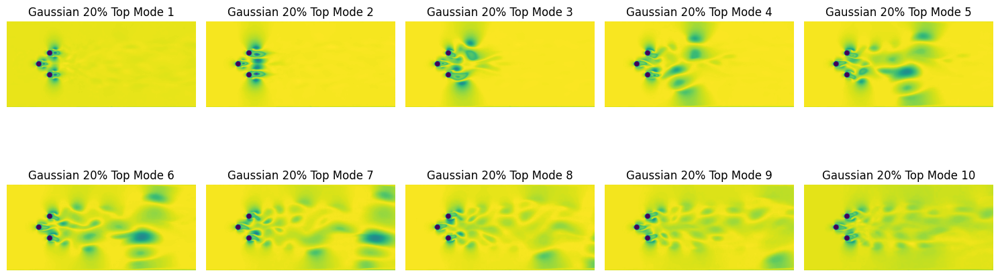

In [311]:
U_reduced = U[:, :k_threshold]
S_reduced = np.diag(S[:k_threshold])
Vt_reduced = Vt[:k_threshold, :]
reconstructed_images = U_reduced @ S_reduced @ Vt_reduced + mean_image

plt.figure(figsize=(15, 6))
for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.imshow(reconstructed_images[i].reshape(images[0].shape), cmap=None)
    plt.title(f"Gaussian 20% Top Mode {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()


In [312]:
# Total Energy of all modes
total_energy = np.sum(S[:k_threshold] ** 2)

# Total Energy of 10 modes
total_energy_top_10_modes = np.sum(S[:10] ** 2)

# % Contribution by 10 modes in total energy
percentage_energy_top_10_modes = (total_energy_top_10_modes / total_energy) * 100
print(f"Total energy: {total_energy}")
print(f"Sum of top 10 singular values: {total_energy_top_10_modes}")
print(f"Percentage of total energy contribution by the top 10 modes: {percentage_energy_top_10_modes:.2f}%")

Total energy: 4740025239.168307
Sum of top 10 singular values: 2885723958.976895
Percentage of total energy contribution by the top 10 modes: 60.88%


In [313]:
# Energy contribution for 10 modes
energy_first_10_modes = (S[:10] ** 2)
total_energy = np.sum(S[:k_threshold] ** 2)

for i, energy in enumerate(energy_first_10_modes, start=1):
    print(f"Energy contribution of mode {i}: {(energy_first_10_modes[i-1]/total_energy)*100:.2f}%")


Energy contribution of mode 1: 10.53%
Energy contribution of mode 2: 8.49%
Energy contribution of mode 3: 7.78%
Energy contribution of mode 4: 7.13%
Energy contribution of mode 5: 5.76%
Energy contribution of mode 6: 5.12%
Energy contribution of mode 7: 4.82%
Energy contribution of mode 8: 3.99%
Energy contribution of mode 9: 3.74%
Energy contribution of mode 10: 3.53%


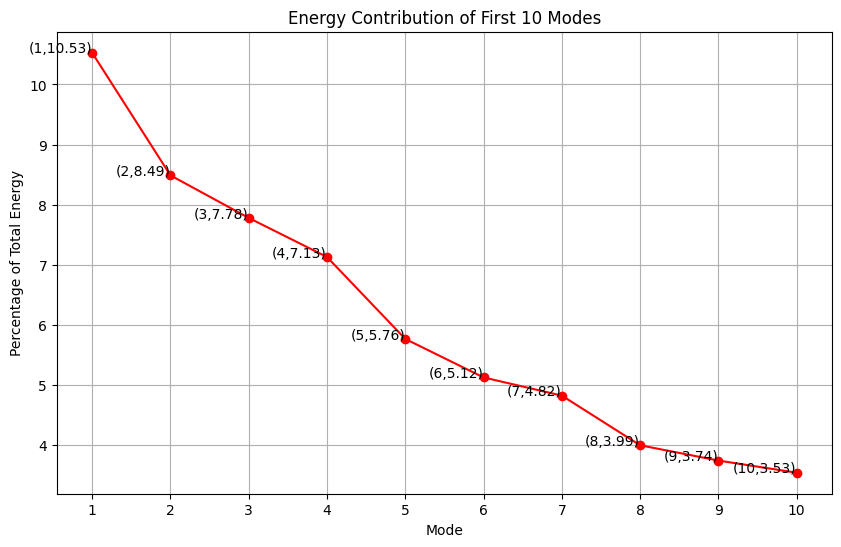

In [314]:
plot_energy_contribution_first_10_modes(energy_first_10_modes, total_energy)

**POD for 40% noised image**

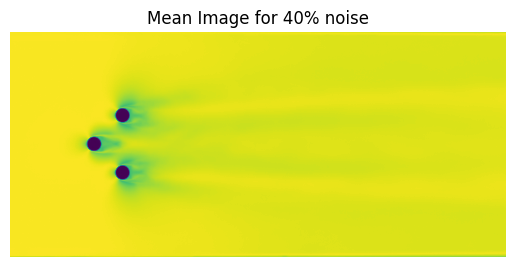

In [315]:
stacked_images = stack_images(images)

mean_image = np.mean(stacked_images, axis=0)

mean_image_reshaped = mean_image.reshape(images[0].shape)

plt.imshow(mean_image_reshaped)
plt.title('Mean Image for 40% noise')
plt.axis('off')
plt.show()

mean_subtracted_images = stacked_images - mean_image

U, S, Vt = np.linalg.svd(mean_subtracted_images, full_matrices=False)

num_modes = 10
dominant_modes = Vt[:num_modes, :]

temporal_coefficients = np.dot(dominant_modes, mean_subtracted_images.T)

reconstructed_images = np.dot(temporal_coefficients.T, dominant_modes) + mean_image

folder_path = "/content/noise_40"

images = load_and_preprocess_images(folder_path)


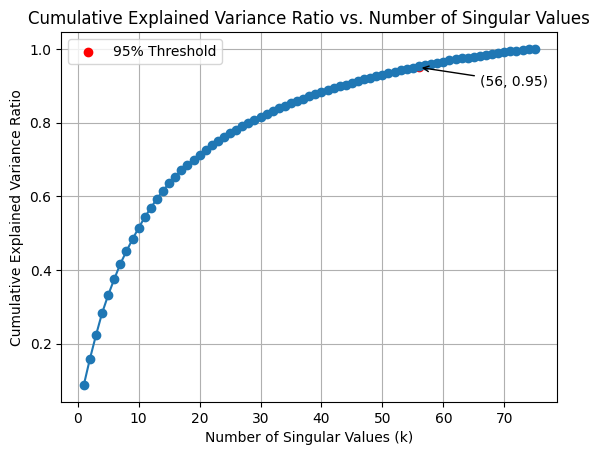

The smallest k that captures 95% of the total variance: 56


In [316]:
k_threshold = plot_cumulative_variance_ratio(S)

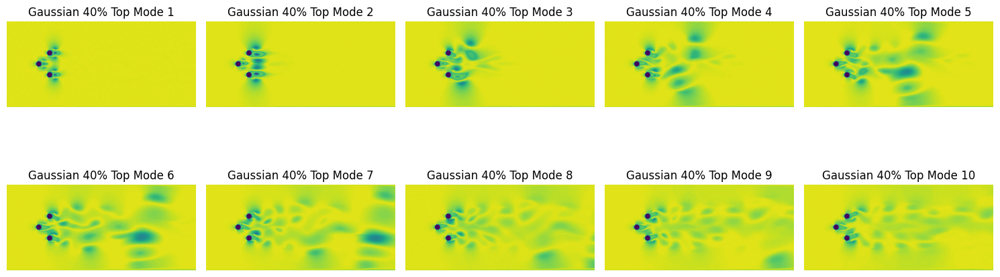

In [317]:
U_reduced = U[:, :k_threshold]
S_reduced = np.diag(S[:k_threshold])
Vt_reduced = Vt[:k_threshold, :]
reconstructed_images = U_reduced @ S_reduced @ Vt_reduced + mean_image

plt.figure(figsize=(15, 6))
for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.imshow(reconstructed_images[i].reshape(images[0].shape), cmap=None)
    plt.title(f"Gaussian 40% Top Mode {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()


In [318]:
# Total Energy of all modes
total_energy = np.sum(S[:k_threshold] ** 2)

# Total Energy of 10 modes
total_energy_top_10_modes = np.sum(S[:10] ** 2)

# % Contribution by 10 modes in total energy
percentage_energy_top_10_modes = (total_energy_top_10_modes / total_energy) * 100
print(f"Total energy: {total_energy}")
print(f"Sum of top 10 singular values: {total_energy_top_10_modes}")
print(f"Percentage of total energy contribution by the top 10 modes: {percentage_energy_top_10_modes:.2f}%")

Total energy: 5474395724.547181
Sum of top 10 singular values: 2954864760.104971
Percentage of total energy contribution by the top 10 modes: 53.98%


In [319]:
# Individual energy of 10 modes
energy_first_10_modes = (S[:10] ** 2)
total_energy = np.sum(S ** 2)


for i, energy in enumerate(energy_first_10_modes, start=1):
    print(f"Energy contribution of mode {i}: {(energy_first_10_modes[i-1]/total_energy)*100:.2f}%")


Energy contribution of mode 1: 8.76%
Energy contribution of mode 2: 7.08%
Energy contribution of mode 3: 6.44%
Energy contribution of mode 4: 6.00%
Energy contribution of mode 5: 4.88%
Energy contribution of mode 6: 4.37%
Energy contribution of mode 7: 4.12%
Energy contribution of mode 8: 3.45%
Energy contribution of mode 9: 3.25%
Energy contribution of mode 10: 3.08%


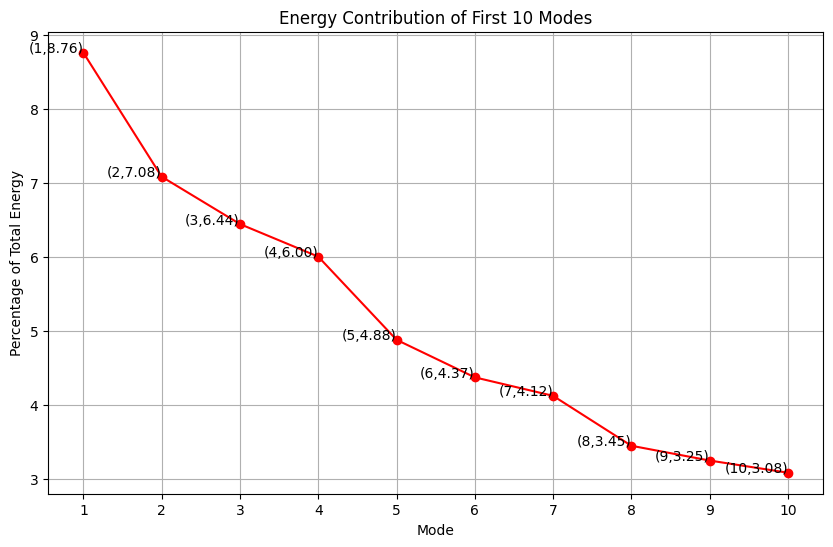

In [320]:
plot_energy_contribution_first_10_modes(energy_first_10_modes, total_energy)

**POD for 60% noised image**

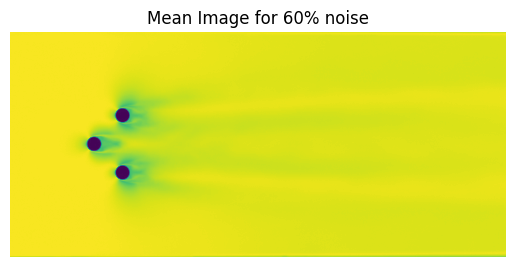

In [321]:
stacked_images = stack_images(images)

mean_image = np.mean(stacked_images, axis=0)

mean_image_reshaped = mean_image.reshape(images[0].shape)

plt.imshow(mean_image_reshaped)
plt.title('Mean Image for 60% noise')
plt.axis('off')
plt.show()

mean_subtracted_images = stacked_images - mean_image

U, S, Vt = np.linalg.svd(mean_subtracted_images, full_matrices=False)

num_modes = 10
dominant_modes = Vt[:num_modes, :]

temporal_coefficients = np.dot(dominant_modes, mean_subtracted_images.T)

reconstructed_images = np.dot(temporal_coefficients.T, dominant_modes) + mean_image

folder_path = "/content/noise_60"

images = load_and_preprocess_images(folder_path)


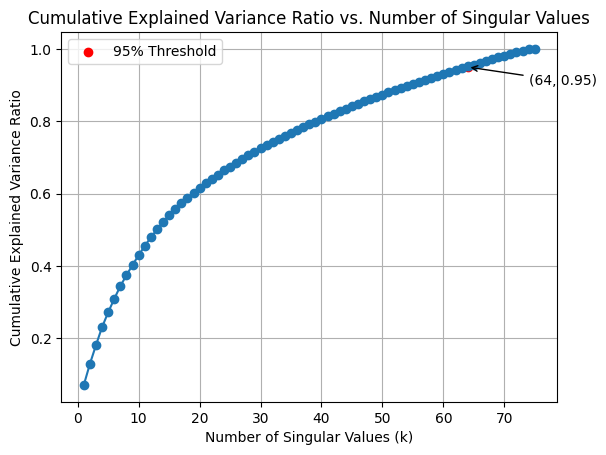

The smallest k that captures 95% of the total variance: 64


In [322]:
k_threshold = plot_cumulative_variance_ratio(S)

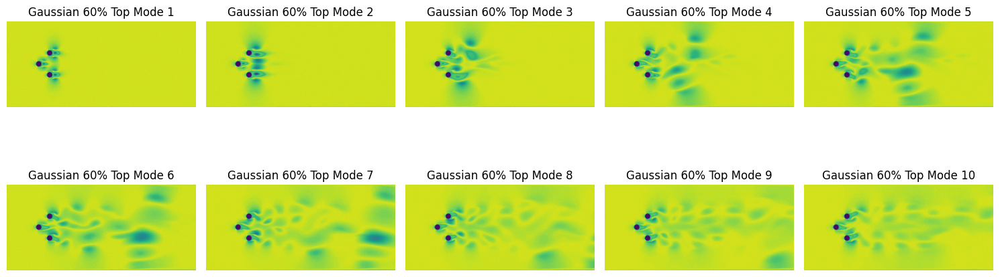

In [323]:
U_reduced = U[:, :k_threshold]
S_reduced = np.diag(S[:k_threshold])
Vt_reduced = Vt[:k_threshold, :]
reconstructed_images = U_reduced @ S_reduced @ Vt_reduced + mean_image

plt.figure(figsize=(15, 6))
for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.imshow(reconstructed_images[i].reshape(images[0].shape), cmap=None)
    plt.title(f"Gaussian 60% Top Mode {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()

In [324]:
# Total Energy of all modes
total_energy = np.sum(S[:k_threshold] ** 2)

# Total Energy of 10 modes
total_energy_top_10_modes = np.sum(S[:10] ** 2)

# % Contribution by 10 modes in total energy
percentage_energy_top_10_modes = (total_energy_top_10_modes / total_energy) * 100
print(f"Total energy: {total_energy}")
print(f"Sum of top 10 singular values: {total_energy_top_10_modes}")
print(f"Percentage of total energy contribution by the top 10 modes: {percentage_energy_top_10_modes:.2f}%")

Total energy: 6789584090.775339
Sum of top 10 singular values: 3068626208.445714
Percentage of total energy contribution by the top 10 modes: 45.20%


In [325]:
# Individual energy of 10 modes
energy_first_10_modes = (S[:10] ** 2)
total_energy = np.sum(S[:k_threshold] ** 2)


for i, energy in enumerate(energy_first_10_modes, start=1):
    print(f"Energy contribution of mode {i}: {(energy_first_10_modes[i-1]/total_energy)*100:.2f}%")


Energy contribution of mode 1: 7.52%
Energy contribution of mode 2: 6.12%
Energy contribution of mode 3: 5.45%
Energy contribution of mode 4: 5.23%
Energy contribution of mode 5: 4.29%
Energy contribution of mode 6: 3.91%
Energy contribution of mode 7: 3.70%
Energy contribution of mode 8: 3.15%
Energy contribution of mode 9: 2.97%
Energy contribution of mode 10: 2.85%


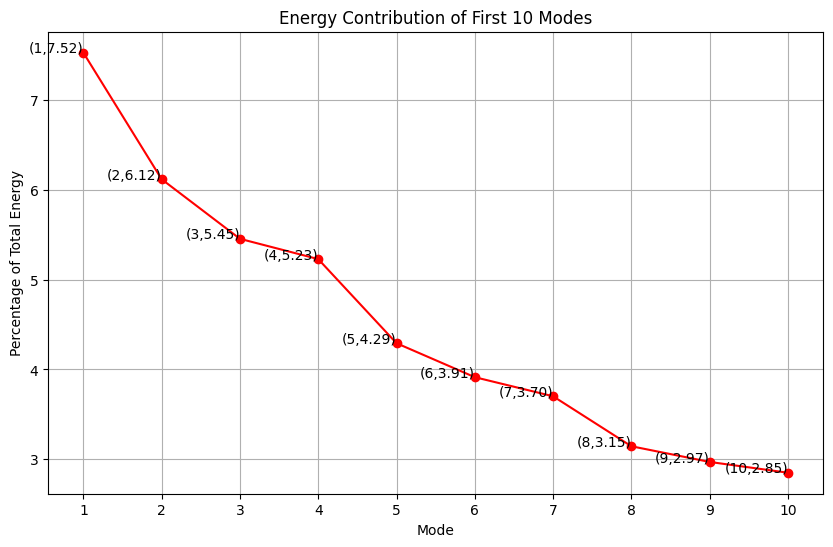

In [326]:
plot_energy_contribution_first_10_modes(energy_first_10_modes, total_energy)

**POD for 80% noised image**

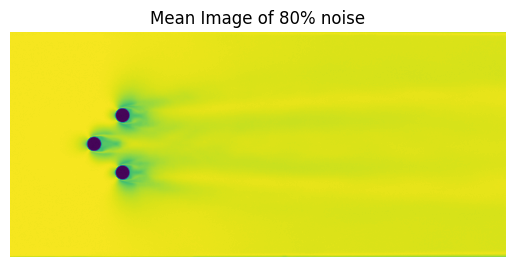

In [327]:
stacked_images = stack_images(images)

mean_image = np.mean(stacked_images, axis=0)

mean_image_reshaped = mean_image.reshape(images[0].shape)

plt.imshow(mean_image_reshaped)
plt.title('Mean Image of 80% noise')
plt.axis('off')
plt.show()

mean_subtracted_images = stacked_images - mean_image

U, S, Vt = np.linalg.svd(mean_subtracted_images, full_matrices=False)

num_modes = 10
dominant_modes = Vt[:num_modes, :]

temporal_coefficients = np.dot(dominant_modes, mean_subtracted_images.T)

reconstructed_images = np.dot(temporal_coefficients.T, dominant_modes) + mean_image

folder_path = "/content/noise_80"

images = load_and_preprocess_images(folder_path)


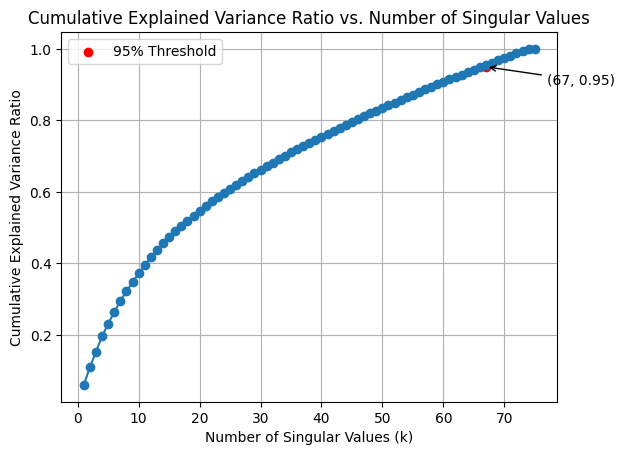

The smallest k that captures 95% of the total variance: 67


In [328]:
k_threshold = plot_cumulative_variance_ratio(S)

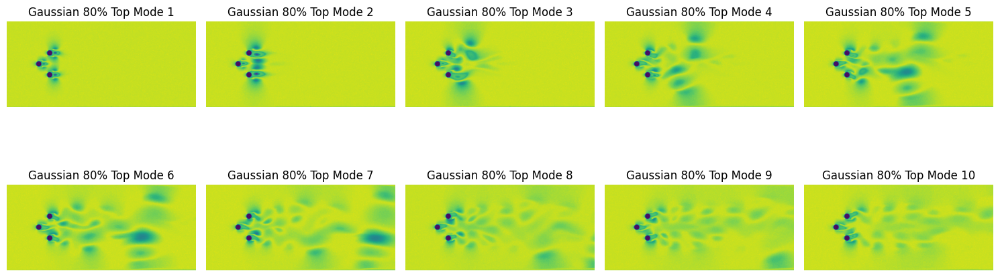

In [329]:
U_reduced = U[:, :k_threshold]
S_reduced = np.diag(S[:k_threshold])
Vt_reduced = Vt[:k_threshold, :]
reconstructed_images = U_reduced @ S_reduced @ Vt_reduced + mean_image

plt.figure(figsize=(15, 6))
for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.imshow(reconstructed_images[i].reshape(images[0].shape), cmap=None)
    plt.title(f"Gaussian 80% Top Mode {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()

In [330]:
# Total Energy of all modes
total_energy = np.sum(S[:k_threshold] ** 2)

# Total Energy of 10 modes
total_energy_top_10_modes = np.sum(S[:10] ** 2)

# % Contribution by 10 modes in total energy
percentage_energy_top_10_modes = (total_energy_top_10_modes / total_energy) * 100
print(f"Total energy: {total_energy}")
print(f"Sum of top 10 singular values: {total_energy_top_10_modes}")
print(f"Percentage of total energy contribution by the top 10 modes: {percentage_energy_top_10_modes:.2f}%")

Total energy: 8229724242.756828
Sum of top 10 singular values: 3207646496.8354087
Percentage of total energy contribution by the top 10 modes: 38.98%


In [331]:
# Individual energy of 10 modes
energy_first_10_modes = (S[:10] ** 2)
total_energy = np.sum(S[:k_threshold] ** 2)


for i, energy in enumerate(energy_first_10_modes, start=1):
    print(f"Energy contribution of mode {i}: {(energy_first_10_modes[i-1]/total_energy)*100:.2f}%")


Energy contribution of mode 1: 6.33%
Energy contribution of mode 2: 5.19%
Energy contribution of mode 3: 4.59%
Energy contribution of mode 4: 4.43%
Energy contribution of mode 5: 3.71%
Energy contribution of mode 6: 3.44%
Energy contribution of mode 7: 3.25%
Energy contribution of mode 8: 2.81%
Energy contribution of mode 9: 2.66%
Energy contribution of mode 10: 2.57%


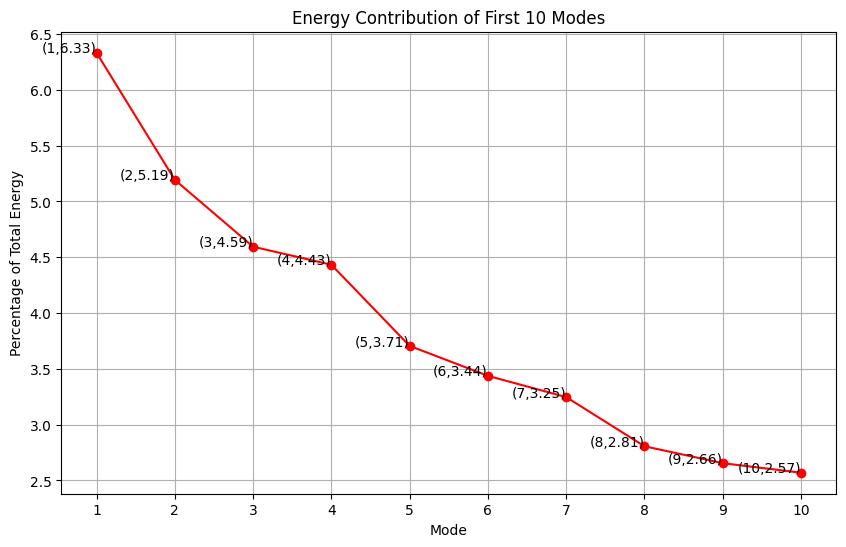

In [332]:
plot_energy_contribution_first_10_modes(energy_first_10_modes, total_energy)

# POD for Speckle added noise

**POD for 20% Speckle noise **

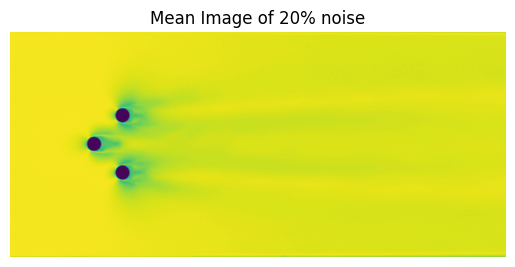

In [333]:
stacked_images = stack_images(images)

mean_image = np.mean(stacked_images, axis=0)

mean_image_reshaped = mean_image.reshape(images[0].shape)

plt.imshow(mean_image_reshaped)
plt.title('Mean Image of 20% noise')
plt.axis('off')
plt.show()

mean_subtracted_images = stacked_images - mean_image

U, S, Vt = np.linalg.svd(mean_subtracted_images, full_matrices=False)

num_modes = 10
dominant_modes = Vt[:num_modes, :]

temporal_coefficients = np.dot(dominant_modes, mean_subtracted_images.T)

reconstructed_images = np.dot(temporal_coefficients.T, dominant_modes) + mean_image

folder_path = "/content/noise_speckle_20"

images = load_and_preprocess_images(folder_path)


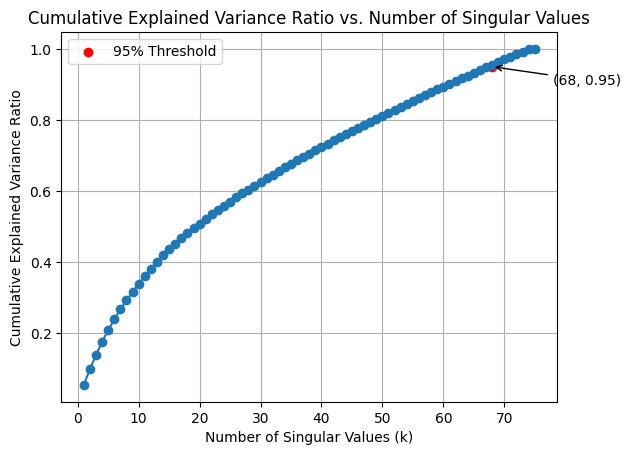

The smallest k that captures 95% of the total variance: 68


In [334]:
k_threshold = plot_cumulative_variance_ratio(S)


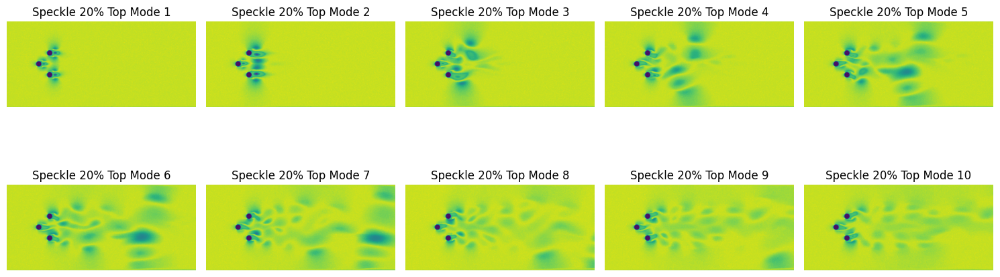

In [335]:
U_reduced = U[:, :k_threshold]
S_reduced = np.diag(S[:k_threshold])
Vt_reduced = Vt[:k_threshold, :]
reconstructed_images = U_reduced @ S_reduced @ Vt_reduced + mean_image

plt.figure(figsize=(15, 6))
for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.imshow(reconstructed_images[i].reshape(images[0].shape), cmap=None)
    plt.title(f"Speckle 20% Top Mode {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()

In [336]:
# Total Energy of all modes
total_energy = np.sum(S[:k_threshold] ** 2)

# Total Energy of 10 modes
total_energy_top_10_modes = np.sum(S[:10] ** 2)

# % Contribution by 10 modes in total energy
percentage_energy_top_10_modes = (total_energy_top_10_modes / total_energy) * 100
print(f"Total energy: {total_energy}")
print(f"Sum of top 10 singular values: {total_energy_top_10_modes}")
print(f"Percentage of total energy contribution by the top 10 modes: {percentage_energy_top_10_modes:.2f}%")

Total energy: 9409140618.069767
Sum of top 10 singular values: 3333118449.6623464
Percentage of total energy contribution by the top 10 modes: 35.42%


In [337]:
# Individual energy of 10 modes
energy_first_10_modes = (S[:10] ** 2)
total_energy = np.sum(S[:k_threshold] ** 2)


for i, energy in enumerate(energy_first_10_modes, start=1):
    print(f"Energy contribution of mode {i}: {(energy_first_10_modes[i-1]/total_energy)*100:.2f}%")


Energy contribution of mode 1: 5.65%
Energy contribution of mode 2: 4.66%
Energy contribution of mode 3: 4.13%
Energy contribution of mode 4: 3.97%
Energy contribution of mode 5: 3.37%
Energy contribution of mode 6: 3.16%
Energy contribution of mode 7: 2.99%
Energy contribution of mode 8: 2.62%
Energy contribution of mode 9: 2.47%
Energy contribution of mode 10: 2.41%


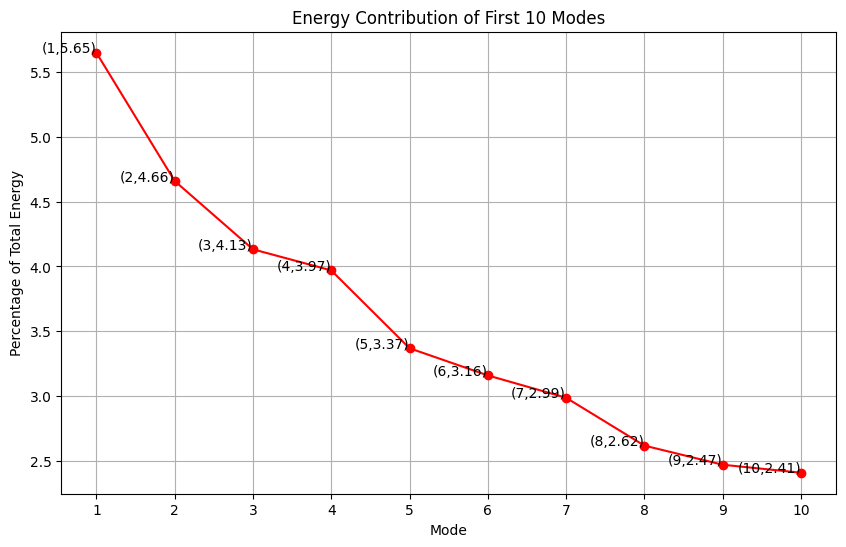

In [338]:
plot_energy_contribution_first_10_modes(energy_first_10_modes, total_energy)

**POD for 40% Speckle noise **

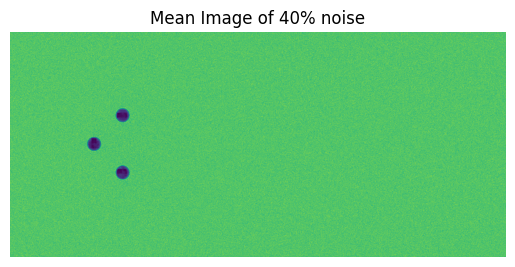

In [339]:
stacked_images = stack_images(images)

mean_image = np.mean(stacked_images, axis=0)

mean_image_reshaped = mean_image.reshape(images[0].shape)

plt.imshow(mean_image_reshaped)
plt.title('Mean Image of 40% noise')
plt.axis('off')
plt.show()

mean_subtracted_images = stacked_images - mean_image

U, S, Vt = np.linalg.svd(mean_subtracted_images, full_matrices=False)

num_modes = 10
dominant_modes = Vt[:num_modes, :]

temporal_coefficients = np.dot(dominant_modes, mean_subtracted_images.T)

reconstructed_images = np.dot(temporal_coefficients.T, dominant_modes) + mean_image

folder_path = "/content/noise_speckle_40"

images = load_and_preprocess_images(folder_path)


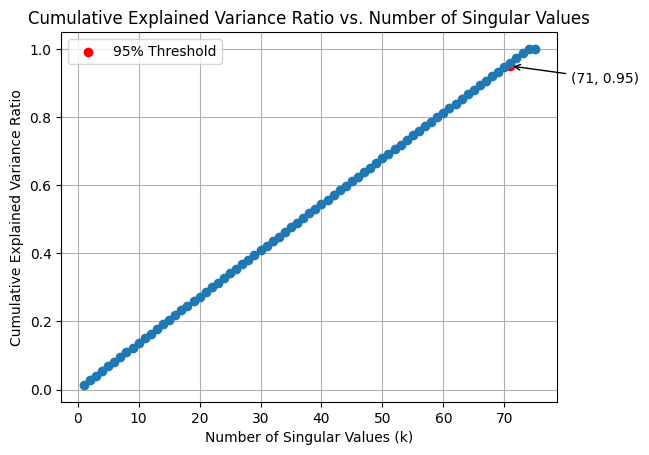

The smallest k that captures 95% of the total variance: 71


In [340]:
k_threshold = plot_cumulative_variance_ratio(S)

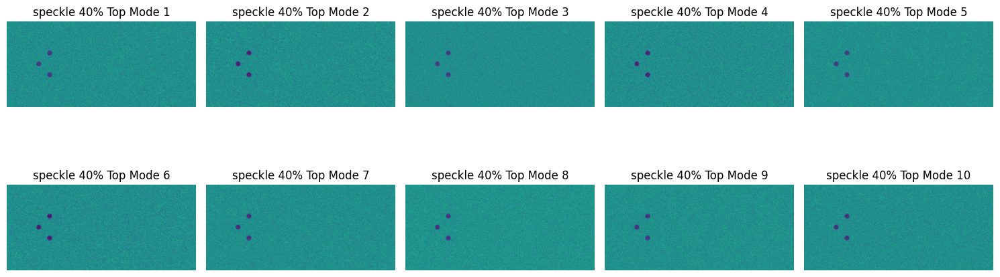

In [341]:
U_reduced = U[:, :k_threshold]
S_reduced = np.diag(S[:k_threshold])
Vt_reduced = Vt[:k_threshold, :]
reconstructed_images = U_reduced @ S_reduced @ Vt_reduced + mean_image

plt.figure(figsize=(15, 6))
for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.imshow(reconstructed_images[i].reshape(images[0].shape), cmap=None)
    plt.title(f"speckle 40% Top Mode {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()

In [342]:
# Total Energy of all modes
total_energy = np.sum(S[:k_threshold] ** 2)

# Total Energy of 10 modes
total_energy_top_10_modes = np.sum(S[:10] ** 2)

# % Contribution by 10 modes in total energy
percentage_energy_top_10_modes = (total_energy_top_10_modes / total_energy) * 100
print(f"Total energy: {total_energy}")
print(f"Sum of top 10 singular values: {total_energy_top_10_modes}")
print(f"Percentage of total energy contribution by the top 10 modes: {percentage_energy_top_10_modes:.2f}%")

Total energy: 508697821967.89655
Sum of top 10 singular values: 72515051572.41489
Percentage of total energy contribution by the top 10 modes: 14.26%


In [343]:
# Individual energy of 10 modes
energy_first_10_modes = (S[:10] ** 2)
total_energy = np.sum(S[:k_threshold] ** 2)


for i, energy in enumerate(energy_first_10_modes, start=1):
    print(f"Energy contribution of mode {i}: {(energy_first_10_modes[i-1]/total_energy)*100:.2f}%")


Energy contribution of mode 1: 1.43%
Energy contribution of mode 2: 1.43%
Energy contribution of mode 3: 1.43%
Energy contribution of mode 4: 1.43%
Energy contribution of mode 5: 1.43%
Energy contribution of mode 6: 1.43%
Energy contribution of mode 7: 1.42%
Energy contribution of mode 8: 1.42%
Energy contribution of mode 9: 1.42%
Energy contribution of mode 10: 1.42%


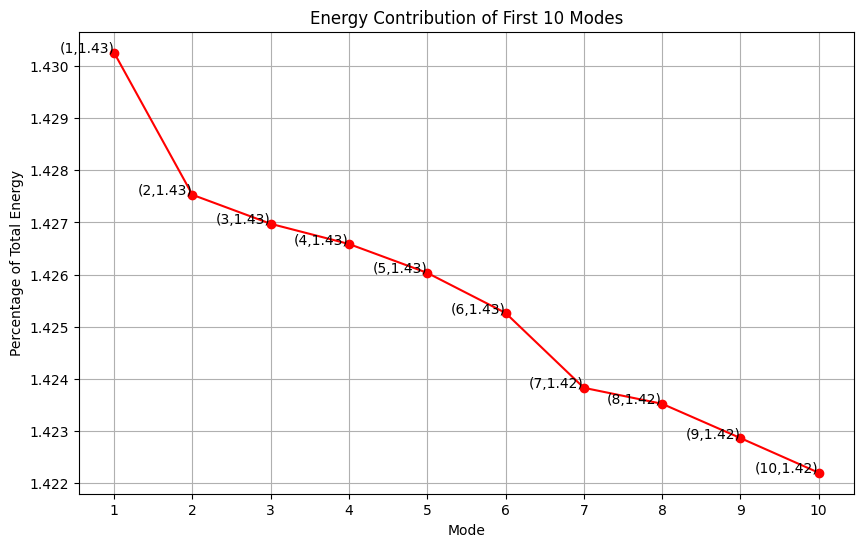

In [344]:
plot_energy_contribution_first_10_modes(energy_first_10_modes, total_energy)

**POD for 60% Speckle noise **

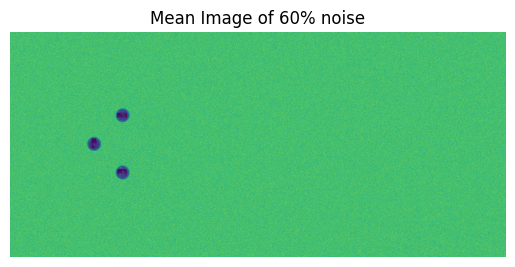

In [345]:
stacked_images = stack_images(images)

mean_image = np.mean(stacked_images, axis=0)

mean_image_reshaped = mean_image.reshape(images[0].shape)

plt.imshow(mean_image_reshaped)
plt.title('Mean Image of 60% noise')
plt.axis('off')
plt.show()

mean_subtracted_images = stacked_images - mean_image

U, S, Vt = np.linalg.svd(mean_subtracted_images, full_matrices=False)

num_modes = 10
dominant_modes = Vt[:num_modes, :]

temporal_coefficients = np.dot(dominant_modes, mean_subtracted_images.T)

reconstructed_images = np.dot(temporal_coefficients.T, dominant_modes) + mean_image

folder_path = "/content/noise_speckle_60"

images = load_and_preprocess_images(folder_path)


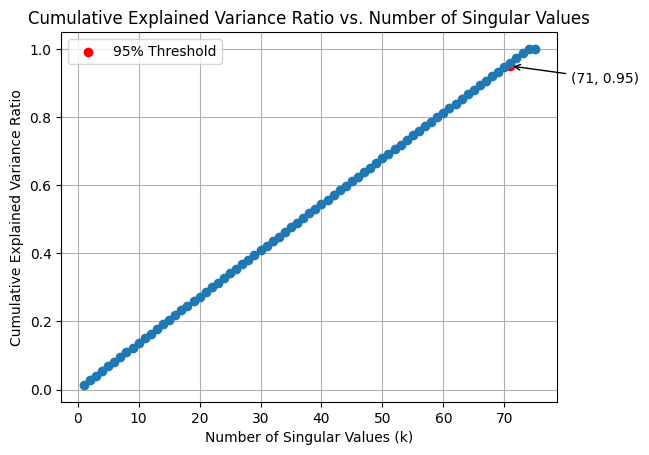

The smallest k that captures 95% of the total variance: 71


In [346]:
k_threshold = plot_cumulative_variance_ratio(S)

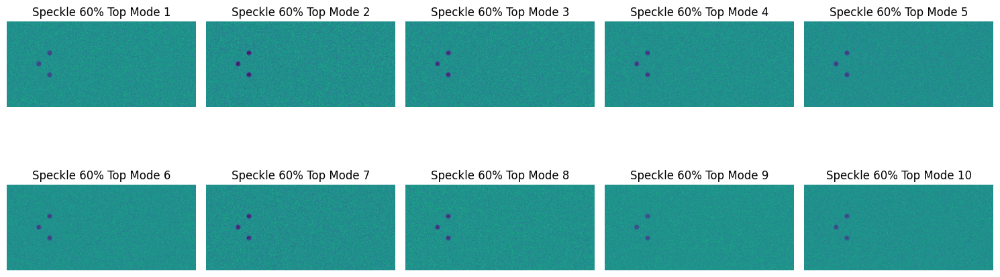

In [347]:
U_reduced = U[:, :k_threshold]
S_reduced = np.diag(S[:k_threshold])
Vt_reduced = Vt[:k_threshold, :]
reconstructed_images = U_reduced @ S_reduced @ Vt_reduced + mean_image

plt.figure(figsize=(15, 6))
for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.imshow(reconstructed_images[i].reshape(images[0].shape), cmap=None)
    plt.title(f"Speckle 60% Top Mode {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()

In [348]:
# Total Energy of all modes
total_energy = np.sum(S[:k_threshold] ** 2)

# Total Energy of 10 modes
total_energy_top_10_modes = np.sum(S[:10] ** 2)

# % Contribution by 10 modes in total energy
percentage_energy_top_10_modes = (total_energy_top_10_modes / total_energy) * 100
print(f"Total energy: {total_energy}")
print(f"Sum of top 10 singular values: {total_energy_top_10_modes}")
print(f"Percentage of total energy contribution by the top 10 modes: {percentage_energy_top_10_modes:.2f}%")

Total energy: 511314721934.85974
Sum of top 10 singular values: 72875049231.79907
Percentage of total energy contribution by the top 10 modes: 14.25%


In [349]:
# Individual energy of 10 modes
energy_first_10_modes = (S[:10] ** 2)
total_energy = np.sum(S[:k_threshold] ** 2)


for i, energy in enumerate(energy_first_10_modes, start=1):
    print(f"Energy contribution of mode {i}: {(energy_first_10_modes[i-1]/total_energy)*100:.2f}%")


Energy contribution of mode 1: 1.43%
Energy contribution of mode 2: 1.43%
Energy contribution of mode 3: 1.43%
Energy contribution of mode 4: 1.43%
Energy contribution of mode 5: 1.43%
Energy contribution of mode 6: 1.42%
Energy contribution of mode 7: 1.42%
Energy contribution of mode 8: 1.42%
Energy contribution of mode 9: 1.42%
Energy contribution of mode 10: 1.42%


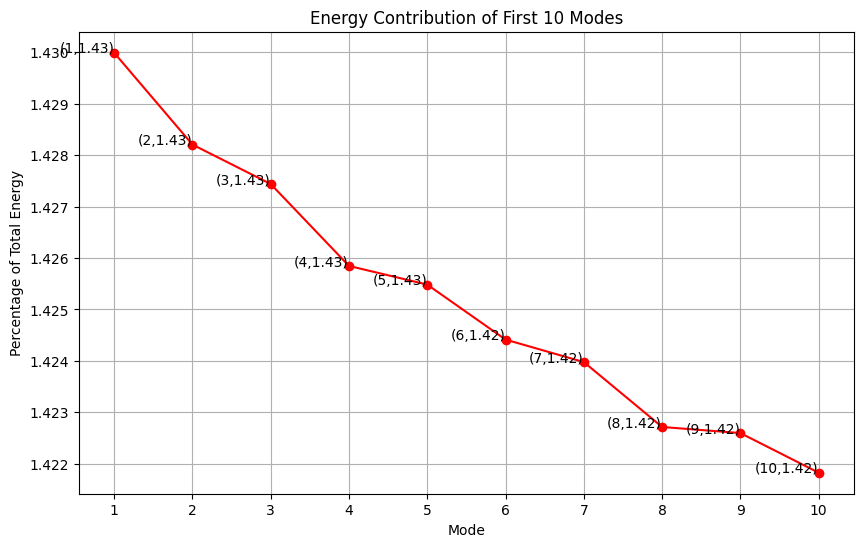

In [350]:
plot_energy_contribution_first_10_modes(energy_first_10_modes, total_energy)

**POD for 80% Speckle noise **

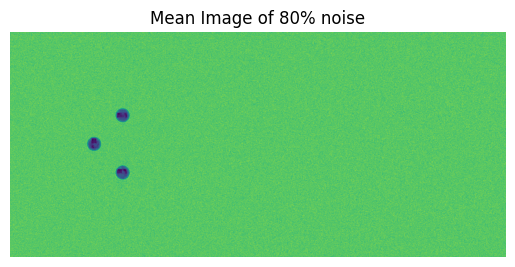

In [351]:
stacked_images = stack_images(images)

mean_image = np.mean(stacked_images, axis=0)

mean_image_reshaped = mean_image.reshape(images[0].shape)

plt.imshow(mean_image_reshaped)
plt.title('Mean Image of 80% noise')
plt.axis('off')
plt.show()

mean_subtracted_images = stacked_images - mean_image

U, S, Vt = np.linalg.svd(mean_subtracted_images, full_matrices=False)

num_modes = 10
dominant_modes = Vt[:num_modes, :]

temporal_coefficients = np.dot(dominant_modes, mean_subtracted_images.T)

reconstructed_images = np.dot(temporal_coefficients.T, dominant_modes) + mean_image

folder_path = "/content/noise_speckle_80"

images = load_and_preprocess_images(folder_path)


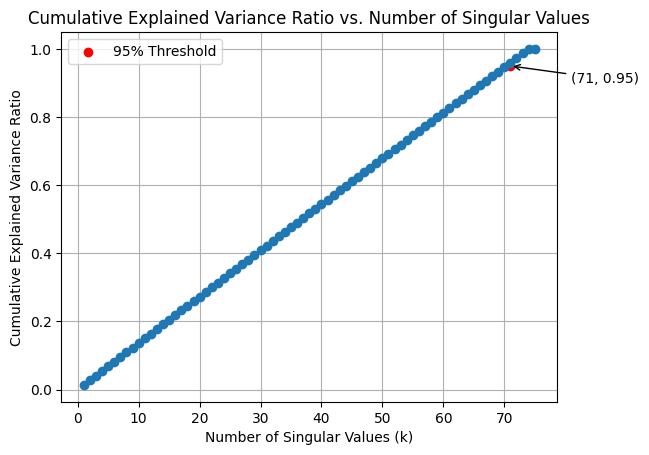

The smallest k that captures 95% of the total variance: 71


In [352]:
k_threshold = plot_cumulative_variance_ratio(S)

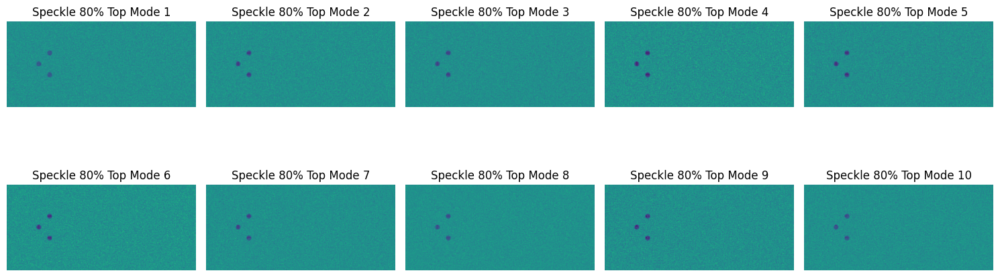

In [353]:
U_reduced = U[:, :k_threshold]
S_reduced = np.diag(S[:k_threshold])
Vt_reduced = Vt[:k_threshold, :]
reconstructed_images = U_reduced @ S_reduced @ Vt_reduced + mean_image

plt.figure(figsize=(15, 6))
for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.imshow(reconstructed_images[i].reshape(images[0].shape), cmap=None)
    plt.title(f"Speckle 80% Top Mode {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()

In [354]:
# Total Energy of all modes
total_energy = np.sum(S[:k_threshold] ** 2)

# Total Energy of 10 modes
total_energy_top_10_modes = np.sum(S[:10] ** 2)

# % Contribution by 10 modes in total energy
percentage_energy_top_10_modes = (total_energy_top_10_modes / total_energy) * 100
print(f"Total energy: {total_energy}")
print(f"Sum of top 10 singular values: {total_energy_top_10_modes}")
print(f"Percentage of total energy contribution by the top 10 modes: {percentage_energy_top_10_modes:.2f}%")

Total energy: 512045647024.3247
Sum of top 10 singular values: 72999757615.52985
Percentage of total energy contribution by the top 10 modes: 14.26%


In [355]:
# Individual energy of 10 modes
energy_first_10_modes = (S[:10] ** 2)
total_energy = np.sum(S[:k_threshold] ** 2)


for i, energy in enumerate(energy_first_10_modes, start=1):
    print(f"Energy contribution of mode {i}: {(energy_first_10_modes[i-1]/total_energy)*100:.2f}%")


Energy contribution of mode 1: 1.43%
Energy contribution of mode 2: 1.43%
Energy contribution of mode 3: 1.43%
Energy contribution of mode 4: 1.43%
Energy contribution of mode 5: 1.43%
Energy contribution of mode 6: 1.42%
Energy contribution of mode 7: 1.42%
Energy contribution of mode 8: 1.42%
Energy contribution of mode 9: 1.42%
Energy contribution of mode 10: 1.42%


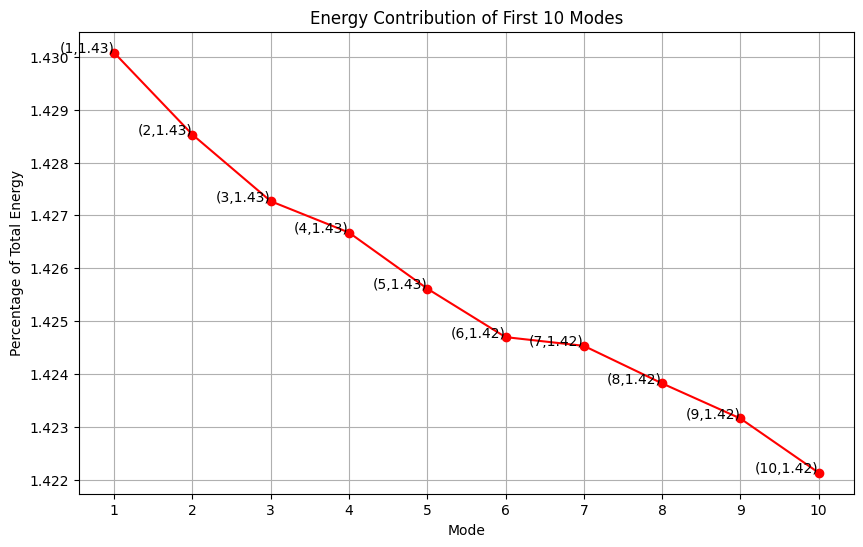

In [356]:
plot_energy_contribution_first_10_modes(energy_first_10_modes, total_energy)

# 5 Super-Resolving

# POD on denoised images using Gaussian Blur

**Function for denoising images using GaussianBlur and saving frames to new folder**

In [357]:
def denoise_images(noisy_folder_path, output_folder_path, blur_kernel_size=(5, 5)):
    if not os.path.exists(output_folder_path):
        os.makedirs(output_folder_path)

    noisy_files = os.listdir(noisy_folder_path)

    # Process each noisy image
    for file_name in noisy_files:
        noisy_image_path = os.path.join(noisy_folder_path, file_name)
        noisy_image = cv2.imread(noisy_image_path)

        denoised_image = cv2.GaussianBlur(noisy_image, blur_kernel_size, 0)

        output_file_name = "denoised_" + file_name
        output_image_path = os.path.join(output_folder_path, output_file_name)
        cv2.imwrite(output_image_path, denoised_image)

output_folder_path = ["/content/denoised_images_20","/content/denoised_images_40", "/content/denoised_images_60","/content/denoised_images_80"]
noise_folder = [ "/content/noise_20",  "/content/noise_40",  "/content/noise_60",  "/content/noise_80"]

for i, folder_path in enumerate(output_folder_path):
  noisy_folder_path = f'{noise_folder[i]}'
  # print(noisy_folder_path)
  output_folder_path = folder_path
  denoise_images(noisy_folder_path, output_folder_path)
  print("Images denoised for " + noise_folder[i])


Images denoised for /content/noise_20
Images denoised for /content/noise_40
Images denoised for /content/noise_60
Images denoised for /content/noise_80


**POD for denoised images with 20% gaussian noise**

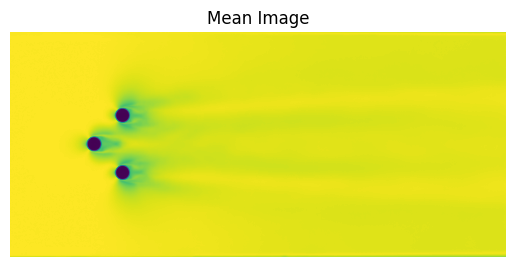

In [358]:
folder_path = "/content/denoised_images_20"

images = load_and_preprocess_images(folder_path)

stacked_images = stack_images(images)

mean_image = np.mean(stacked_images, axis=0)

mean_image_reshaped = mean_image.reshape(images[0].shape)

plt.imshow(mean_image_reshaped)
plt.title('Mean Image')
plt.axis('off')
plt.show()

mean_subtracted_images = stacked_images - mean_image

U, S, Vt = np.linalg.svd(mean_subtracted_images, full_matrices=False)

num_modes = 10
dominant_modes = Vt[:num_modes, :]

temporal_coefficients = np.dot(dominant_modes, mean_subtracted_images.T)

reconstructed_images = np.dot(temporal_coefficients.T, dominant_modes) + mean_image

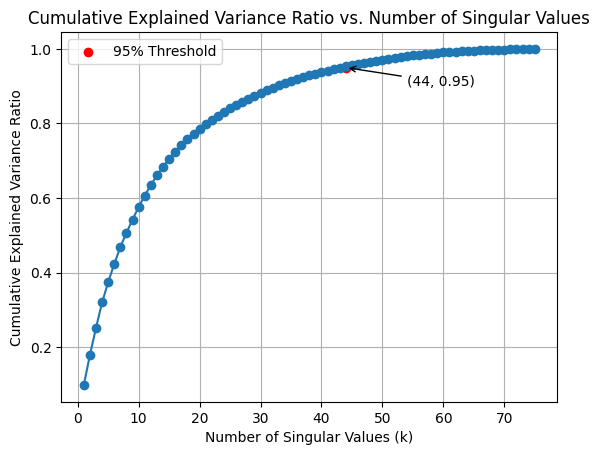

The smallest k that captures 95% of the total variance: 44


In [359]:
k_threshold = plot_cumulative_variance_ratio(S)

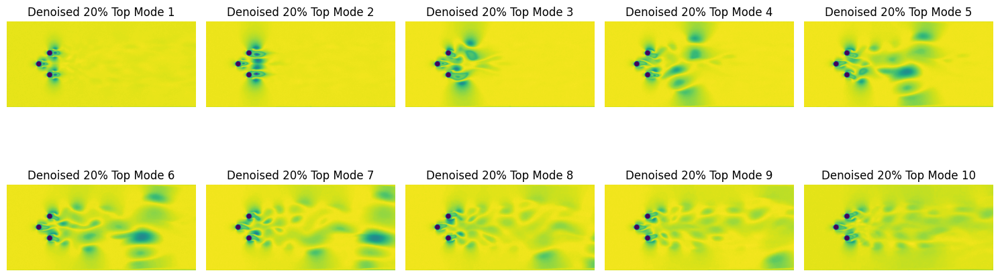

In [360]:
U_reduced = U[:, :k_threshold]
S_reduced = np.diag(S[:k_threshold])
Vt_reduced = Vt[:k_threshold, :]
reconstructed_images = U_reduced @ S_reduced @ Vt_reduced + mean_image

plt.figure(figsize=(15, 6))
for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.imshow(reconstructed_images[i].reshape(images[0].shape), cmap=None)
    plt.title(f"Denoised 20% Top Mode {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()

In [361]:
# Total Energy of all modes
total_energy = np.sum(S[:k_threshold] ** 2)

# Total Energy of 10 modes
total_energy_top_10_modes = np.sum(S[:10] ** 2)

# % Contribution by 10 modes in total energy
percentage_energy_top_10_modes = (total_energy_top_10_modes / total_energy) * 100
print(f"Total energy: {total_energy}")
print(f"Sum of top 10 singular values: {total_energy_top_10_modes}")
print(f"Percentage of total energy contribution by the top 10 modes: {percentage_energy_top_10_modes:.2f}%")

Total energy: 4680228529.486216
Sum of top 10 singular values: 2829325599.0739822
Percentage of total energy contribution by the top 10 modes: 60.45%


In [362]:
# Individual energy of 10 modes
energy_first_10_modes = (S[:10] ** 2)
total_energy = np.sum(S[:k_threshold] ** 2)


for i, energy in enumerate(energy_first_10_modes, start=1):
    print(f"Energy contribution of mode {i}: {(energy_first_10_modes[i-1]/total_energy)*100:.2f}%")


Energy contribution of mode 1: 10.37%
Energy contribution of mode 2: 8.41%
Energy contribution of mode 3: 7.67%
Energy contribution of mode 4: 7.12%
Energy contribution of mode 5: 5.75%
Energy contribution of mode 6: 5.10%
Energy contribution of mode 7: 4.78%
Energy contribution of mode 8: 3.98%
Energy contribution of mode 9: 3.73%
Energy contribution of mode 10: 3.53%


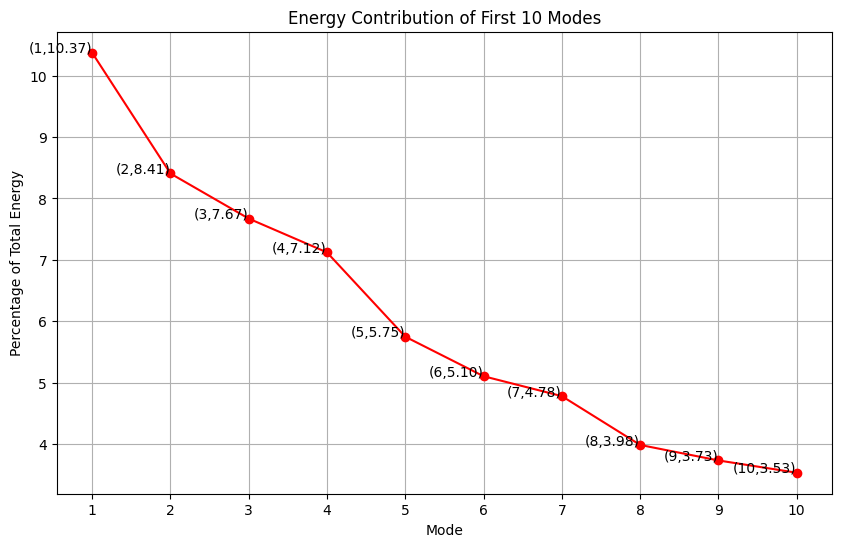

In [363]:
plot_energy_contribution_first_10_modes(energy_first_10_modes, total_energy)

**POD for denoised images with 40% gaussian noise**

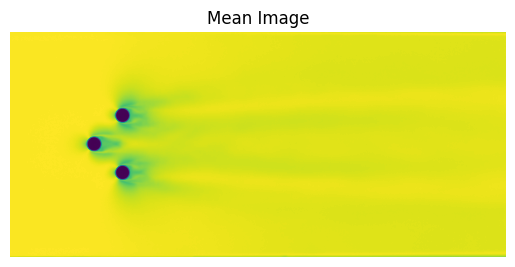

In [364]:
folder_path = "/content/denoised_images_40"

images = load_and_preprocess_images(folder_path)

stacked_images = stack_images(images)

mean_image = np.mean(stacked_images, axis=0)

mean_image_reshaped = mean_image.reshape(images[0].shape)

plt.imshow(mean_image_reshaped)
plt.title('Mean Image')
plt.axis('off')
plt.show()

mean_subtracted_images = stacked_images - mean_image

U, S, Vt = np.linalg.svd(mean_subtracted_images, full_matrices=False)

num_modes = 10
dominant_modes = Vt[:num_modes, :]

temporal_coefficients = np.dot(dominant_modes, mean_subtracted_images.T)

reconstructed_images = np.dot(temporal_coefficients.T, dominant_modes) + mean_image

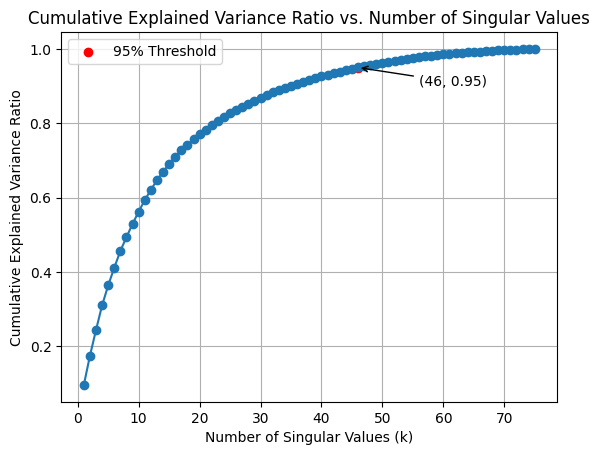

The smallest k that captures 95% of the total variance: 46


In [365]:
k_threshold = plot_cumulative_variance_ratio(S)

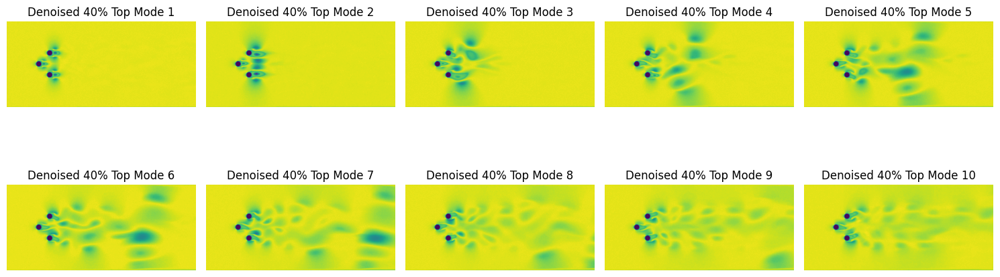

In [366]:
U_reduced = U[:, :k_threshold]
S_reduced = np.diag(S[:k_threshold])
Vt_reduced = Vt[:k_threshold, :]
reconstructed_images = U_reduced @ S_reduced @ Vt_reduced + mean_image

plt.figure(figsize=(15, 6))
for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.imshow(reconstructed_images[i].reshape(images[0].shape), cmap=None)
    plt.title(f"Denoised 40% Top Mode {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()

In [367]:
# Total Energy of all modes
total_energy = np.sum(S[:k_threshold] ** 2)

# Total Energy of 10 modes
total_energy_top_10_modes = np.sum(S[:10] ** 2)

# % Contribution by 10 modes in total energy
percentage_energy_top_10_modes = (total_energy_top_10_modes / total_energy) * 100
print(f"Total energy: {total_energy}")
print(f"Sum of top 10 singular values: {total_energy_top_10_modes}")
print(f"Percentage of total energy contribution by the top 10 modes: {percentage_energy_top_10_modes:.2f}%")

Total energy: 4667248818.97962
Sum of top 10 singular values: 2762683378.8304334
Percentage of total energy contribution by the top 10 modes: 59.19%


In [368]:
# Individual energy of 10 modes
energy_first_10_modes = (S[:10] ** 2)
total_energy = np.sum(S[:k_threshold] ** 2)


for i, energy in enumerate(energy_first_10_modes, start=1):
    print(f"Energy contribution of mode {i}: {(energy_first_10_modes[i-1]/total_energy)*100:.2f}%")


Energy contribution of mode 1: 10.16%
Energy contribution of mode 2: 8.21%
Energy contribution of mode 3: 7.33%
Energy contribution of mode 4: 6.98%
Energy contribution of mode 5: 5.63%
Energy contribution of mode 6: 5.03%
Energy contribution of mode 7: 4.72%
Energy contribution of mode 8: 3.93%
Energy contribution of mode 9: 3.70%
Energy contribution of mode 10: 3.50%


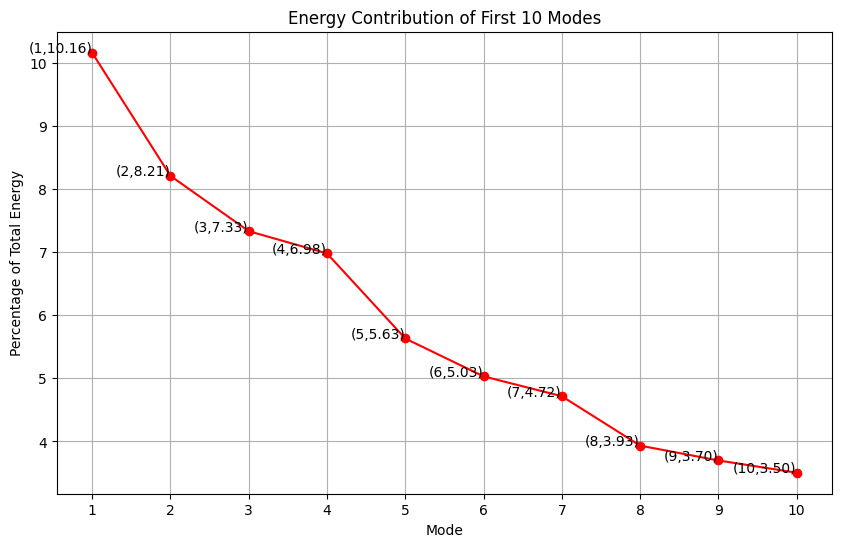

In [369]:
plot_energy_contribution_first_10_modes(energy_first_10_modes, total_energy)

**POD for denoised images with 60% gaussian noise**

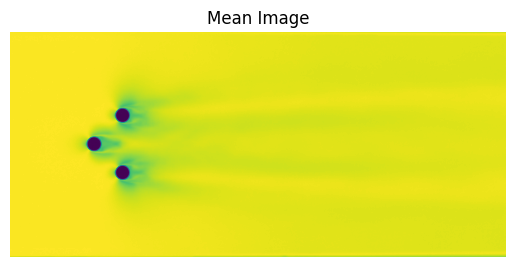

In [370]:
folder_path = "/content/denoised_images_60"

images = load_and_preprocess_images(folder_path)

stacked_images = stack_images(images)

mean_image = np.mean(stacked_images, axis=0)

mean_image_reshaped = mean_image.reshape(images[0].shape)

plt.imshow(mean_image_reshaped)
plt.title('Mean Image')
plt.axis('off')
plt.show()

mean_subtracted_images = stacked_images - mean_image

U, S, Vt = np.linalg.svd(mean_subtracted_images, full_matrices=False)

num_modes = 10
dominant_modes = Vt[:num_modes, :]

temporal_coefficients = np.dot(dominant_modes, mean_subtracted_images.T)

reconstructed_images = np.dot(temporal_coefficients.T, dominant_modes) + mean_image


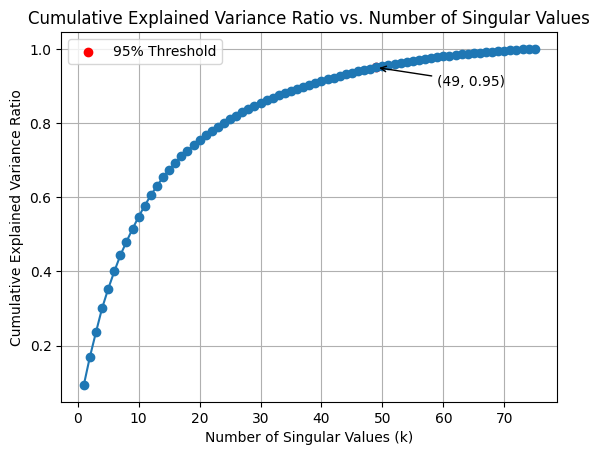

The smallest k that captures 95% of the total variance: 49


In [371]:
k_threshold = plot_cumulative_variance_ratio(S)

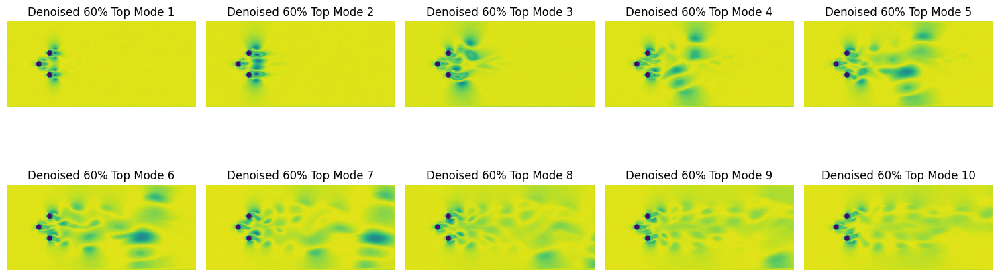

In [372]:
U_reduced = U[:, :k_threshold]
S_reduced = np.diag(S[:k_threshold])
Vt_reduced = Vt[:k_threshold, :]
reconstructed_images = U_reduced @ S_reduced @ Vt_reduced + mean_image

plt.figure(figsize=(15, 6))
for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.imshow(reconstructed_images[i].reshape(images[0].shape), cmap=None)
    plt.title(f"Denoised 60% Top Mode {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()

In [373]:
# Total Energy of all modes
total_energy = np.sum(S[:k_threshold] ** 2)

# Total Energy of 10 modes
total_energy_top_10_modes = np.sum(S[:10] ** 2)

# % Contribution by 10 modes in total energy
percentage_energy_top_10_modes = (total_energy_top_10_modes / total_energy) * 100
print(f"Total energy: {total_energy}")
print(f"Sum of top 10 singular values: {total_energy_top_10_modes}")
print(f"Percentage of total energy contribution by the top 10 modes: {percentage_energy_top_10_modes:.2f}%")

Total energy: 4714629277.903011
Sum of top 10 singular values: 2716143023.123403
Percentage of total energy contribution by the top 10 modes: 57.61%


In [374]:
# Individual energy of 10 modes
energy_first_10_modes = (S[:10] ** 2)
total_energy = np.sum(S[:k_threshold] ** 2)


for i, energy in enumerate(energy_first_10_modes, start=1):
    print(f"Energy contribution of mode {i}: {(energy_first_10_modes[i-1]/total_energy)*100:.2f}%")


Energy contribution of mode 1: 9.86%
Energy contribution of mode 2: 7.98%
Energy contribution of mode 3: 7.04%
Energy contribution of mode 4: 6.77%
Energy contribution of mode 5: 5.49%
Energy contribution of mode 6: 4.93%
Energy contribution of mode 7: 4.61%
Energy contribution of mode 8: 3.85%
Energy contribution of mode 9: 3.64%
Energy contribution of mode 10: 3.44%


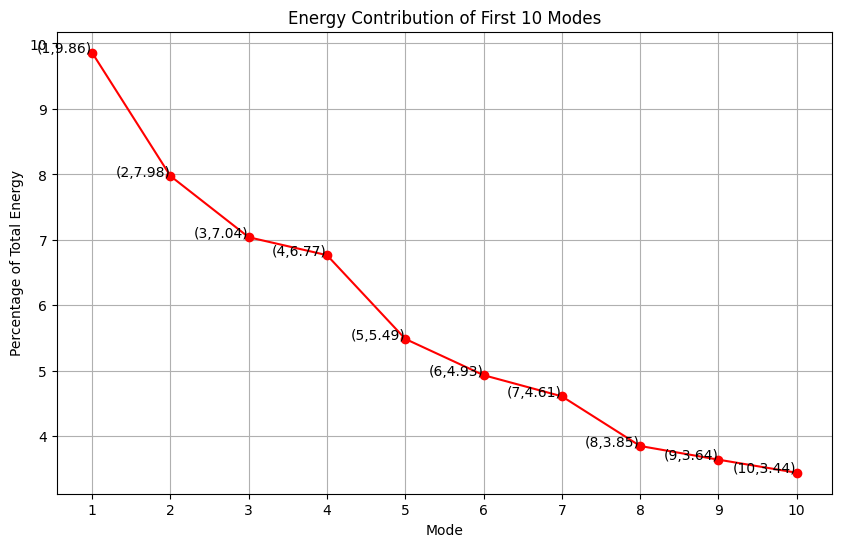

In [375]:
plot_energy_contribution_first_10_modes(energy_first_10_modes, total_energy)

**POD for denoised images with 80% gaussian noise**

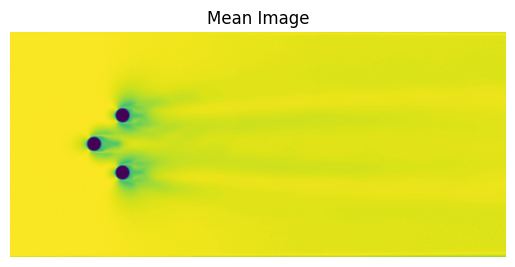

In [376]:
folder_path = "/content/denoised_images_80"

images = load_and_preprocess_images(folder_path)

stacked_images = stack_images(images)

mean_image = np.mean(stacked_images, axis=0)

mean_image_reshaped = mean_image.reshape(images[0].shape)

plt.imshow(mean_image_reshaped)
plt.title('Mean Image')
plt.axis('off')
plt.show()

mean_subtracted_images = stacked_images - mean_image

U, S, Vt = np.linalg.svd(mean_subtracted_images, full_matrices=False)

num_modes = 10
dominant_modes = Vt[:num_modes, :]

temporal_coefficients = np.dot(dominant_modes, mean_subtracted_images.T)

reconstructed_images = np.dot(temporal_coefficients.T, dominant_modes) + mean_image



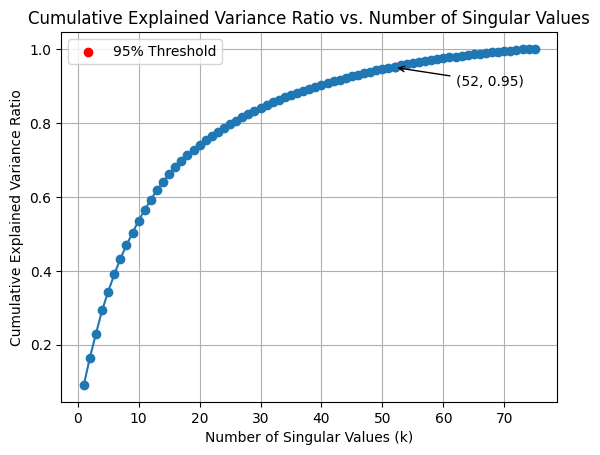

The smallest k that captures 95% of the total variance: 52


In [377]:
k_threshold = plot_cumulative_variance_ratio(S)

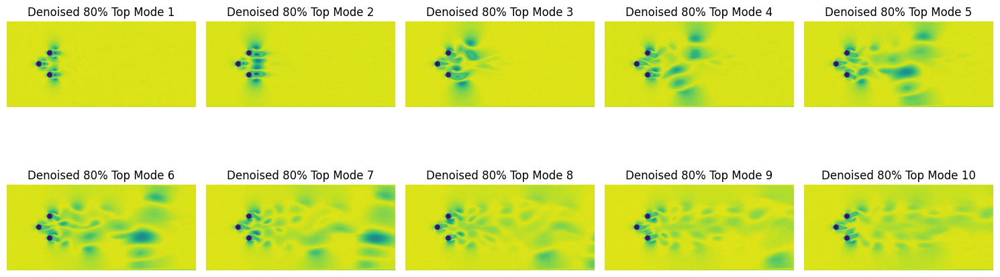

In [378]:
U_reduced = U[:, :k_threshold]
S_reduced = np.diag(S[:k_threshold])
Vt_reduced = Vt[:k_threshold, :]
reconstructed_images = U_reduced @ S_reduced @ Vt_reduced + mean_image

plt.figure(figsize=(15, 6))
for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.imshow(reconstructed_images[i].reshape(images[0].shape), cmap=None)
    plt.title(f"Denoised 80% Top Mode {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()

In [379]:
# Total Energy of all modes
total_energy = np.sum(S[:k_threshold] ** 2)

# Total Energy of 10 modes
total_energy_top_10_modes = np.sum(S[:10] ** 2)

# % Contribution by 10 modes in total energy
percentage_energy_top_10_modes = (total_energy_top_10_modes / total_energy) * 100
print(f"Total energy: {total_energy}")
print(f"Sum of top 10 singular values: {total_energy_top_10_modes}")
print(f"Percentage of total energy contribution by the top 10 modes: {percentage_energy_top_10_modes:.2f}%")

Total energy: 4784569898.91959
Sum of top 10 singular values: 2690617286.7081594
Percentage of total energy contribution by the top 10 modes: 56.24%


In [380]:
# Individual energy of 10 modes
energy_first_10_modes = (S[:10] ** 2)
total_energy = np.sum(S[:k_threshold] ** 2)


for i, energy in enumerate(energy_first_10_modes, start=1):
    print(f"Energy contribution of mode {i}: {(energy_first_10_modes[i-1]/total_energy)*100:.2f}%")


Energy contribution of mode 1: 9.60%
Energy contribution of mode 2: 7.76%
Energy contribution of mode 3: 6.83%
Energy contribution of mode 4: 6.58%
Energy contribution of mode 5: 5.36%
Energy contribution of mode 6: 4.84%
Energy contribution of mode 7: 4.52%
Energy contribution of mode 8: 3.78%
Energy contribution of mode 9: 3.58%
Energy contribution of mode 10: 3.39%


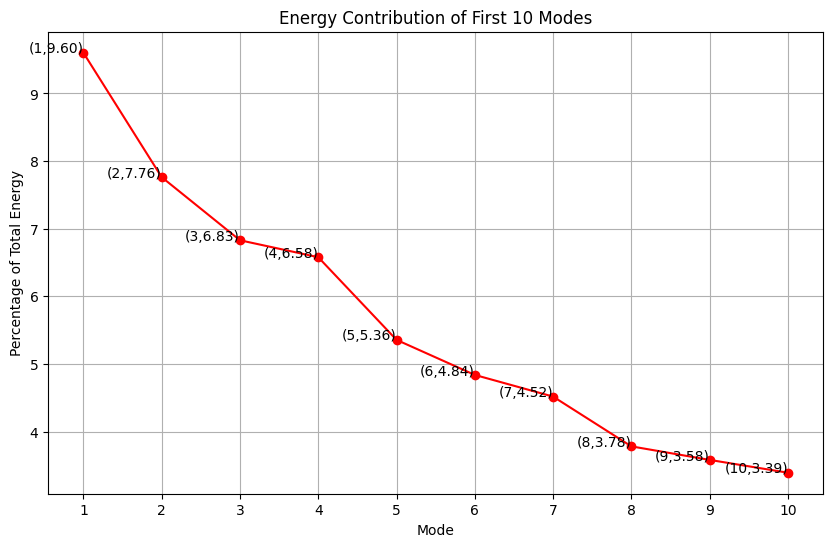

In [381]:
plot_energy_contribution_first_10_modes(energy_first_10_modes, total_energy)

# POD on noise removed images using NLM method

**Function for NLM noise removing technique**

In [382]:
def denoise_image_nlm(input_image_path, output_image_path, h=10, hColor=10, templateWindowSize=7, searchWindowSize=21):
    image = cv2.imread(input_image_path)

    # NLM works on gray images
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    denoised_image = cv2.fastNlMeansDenoising(gray_image, None, h, templateWindowSize, searchWindowSize)

    cv2.imwrite(output_image_path, denoised_image)

**Noise removed on 20% noisy images using NLM**

In [383]:
input_folder = "/content/noise_20"
output_folder = "denoised_images_NLM_20"

os.makedirs(output_folder, exist_ok=True)

for filename in os.listdir(input_folder):
    if filename.endswith(".jpg"):
        input_image_path = os.path.join(input_folder, filename)
        output_image_path = os.path.join(output_folder, filename)
        denoise_image_nlm(input_image_path, output_image_path)

**Noise removed on 40% noisy images using NLM**

In [384]:
input_folder = "/content/noise_40"
output_folder = "denoised_images_NLM_40"

os.makedirs(output_folder, exist_ok=True)

for filename in os.listdir(input_folder):
    if filename.endswith(".jpg"):
        input_image_path = os.path.join(input_folder, filename)
        output_image_path = os.path.join(output_folder, filename)
        denoise_image_nlm(input_image_path, output_image_path)

**Noise removed on 60% noisy images using NLM**

In [385]:
input_folder = "/content/noise_60"
output_folder = "denoised_images_NLM_60"

os.makedirs(output_folder, exist_ok=True)

for filename in os.listdir(input_folder):
    if filename.endswith(".jpg"):
        input_image_path = os.path.join(input_folder, filename)
        output_image_path = os.path.join(output_folder, filename)
        denoise_image_nlm(input_image_path, output_image_path)

**Noise removed on 80% noisy images using NLM**

In [386]:
input_folder = "/content/noise_80"
output_folder = "denoised_images_NLM_80"

os.makedirs(output_folder, exist_ok=True)

for filename in os.listdir(input_folder):
    if filename.endswith(".jpg"):
        input_image_path = os.path.join(input_folder, filename)
        output_image_path = os.path.join(output_folder, filename)
        denoise_image_nlm(input_image_path, output_image_path)

**POD on 20% noise removed using NLM**

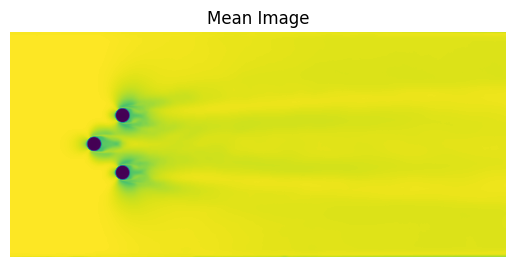

In [387]:
folder_path = "/content/denoised_images_NLM_20"

images = load_and_preprocess_images(folder_path)

stacked_images = stack_images(images)

mean_image = np.mean(stacked_images, axis=0)

mean_image_reshaped = mean_image.reshape(images[0].shape)

plt.imshow(mean_image_reshaped)
plt.title('Mean Image')
plt.axis('off')
plt.show()

mean_subtracted_images = stacked_images - mean_image

U, S, Vt = np.linalg.svd(mean_subtracted_images, full_matrices=False)

num_modes = 10
dominant_modes = Vt[:num_modes, :]

temporal_coefficients = np.dot(dominant_modes, mean_subtracted_images.T)

reconstructed_images = np.dot(temporal_coefficients.T, dominant_modes) + mean_image


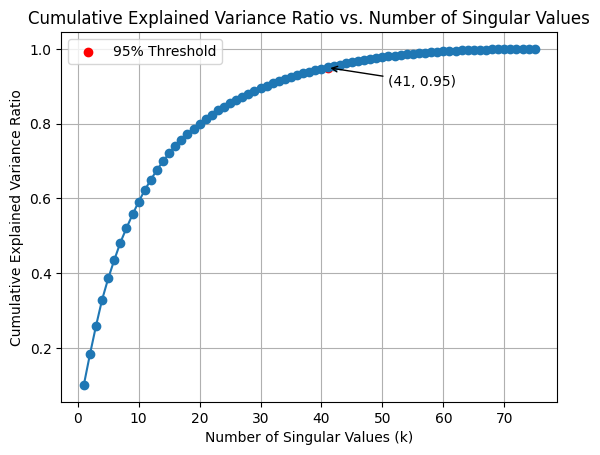

The smallest k that captures 95% of the total variance: 41


In [388]:
k_threshold = plot_cumulative_variance_ratio(S)

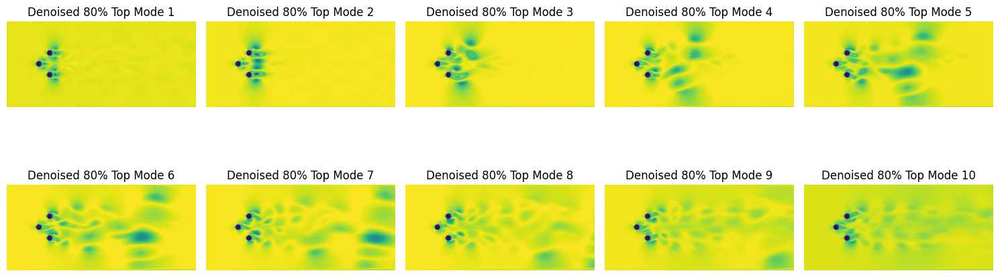

In [389]:
U_reduced = U[:, :k_threshold]
S_reduced = np.diag(S[:k_threshold])
Vt_reduced = Vt[:k_threshold, :]
reconstructed_images = U_reduced @ S_reduced @ Vt_reduced + mean_image

plt.figure(figsize=(15, 6))
for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.imshow(reconstructed_images[i].reshape(images[0].shape), cmap=None)
    plt.title(f"Denoised 80% Top Mode {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()

In [390]:
# Total Energy of all modes
total_energy = np.sum(S[:k_threshold] ** 2)

# Total Energy of 10 modes
total_energy_top_10_modes = np.sum(S[:10] ** 2)

# % Contribution by 10 modes in total energy
percentage_energy_top_10_modes = (total_energy_top_10_modes / total_energy) * 100
print(f"Total energy: {total_energy}")
print(f"Sum of top 10 singular values: {total_energy_top_10_modes}")
print(f"Percentage of total energy contribution by the top 10 modes: {percentage_energy_top_10_modes:.2f}%")

Total energy: 4431421861.52566
Sum of top 10 singular values: 2754112818.6648903
Percentage of total energy contribution by the top 10 modes: 62.15%


In [391]:
# Individual energy of 10 modes
energy_first_10_modes = (S[:10] ** 2)
total_energy = np.sum(S[:k_threshold] ** 2)


for i, energy in enumerate(energy_first_10_modes, start=1):
    print(f"Energy contribution of mode {i}: {(energy_first_10_modes[i-1]/total_energy)*100:.2f}%")


Energy contribution of mode 1: 10.59%
Energy contribution of mode 2: 8.57%
Energy contribution of mode 3: 8.03%
Energy contribution of mode 4: 7.39%
Energy contribution of mode 5: 5.96%
Energy contribution of mode 6: 5.22%
Energy contribution of mode 7: 4.90%
Energy contribution of mode 8: 4.09%
Energy contribution of mode 9: 3.81%
Energy contribution of mode 10: 3.58%


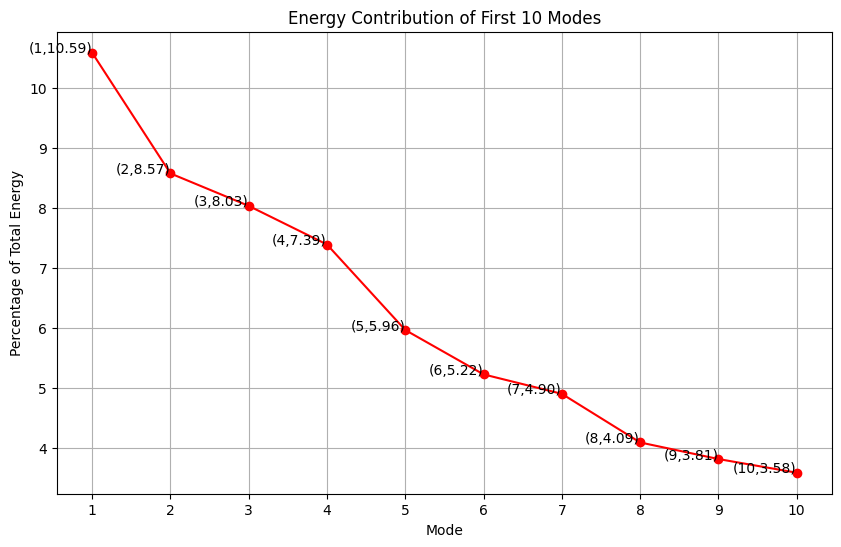

In [392]:
plot_energy_contribution_first_10_modes(energy_first_10_modes, total_energy)

**POD on 40% noise removed using NLM**

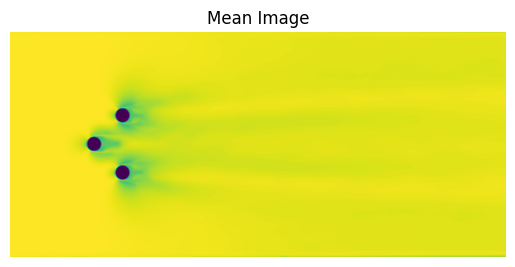

In [393]:
folder_path = "/content/denoised_images_NLM_40"

images = load_and_preprocess_images(folder_path)

stacked_images = stack_images(images)

mean_image = np.mean(stacked_images, axis=0)

mean_image_reshaped = mean_image.reshape(images[0].shape)

plt.imshow(mean_image_reshaped)
plt.title('Mean Image')
plt.axis('off')
plt.show()

mean_subtracted_images = stacked_images - mean_image

U, S, Vt = np.linalg.svd(mean_subtracted_images, full_matrices=False)

num_modes = 10
dominant_modes = Vt[:num_modes, :]

temporal_coefficients = np.dot(dominant_modes, mean_subtracted_images.T)

reconstructed_images = np.dot(temporal_coefficients.T, dominant_modes) + mean_image



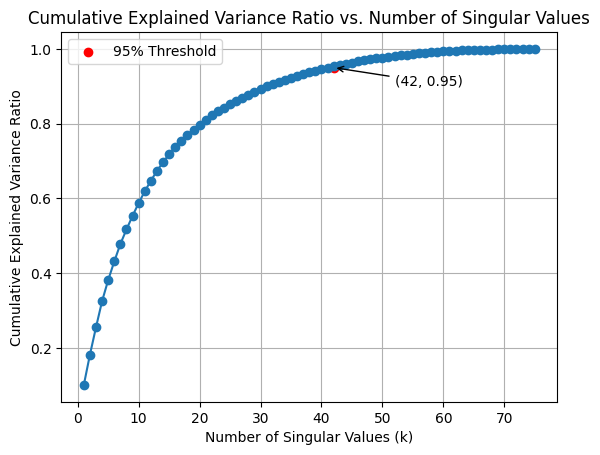

The smallest k that captures 95% of the total variance: 42


In [394]:
k_threshold = plot_cumulative_variance_ratio(S)

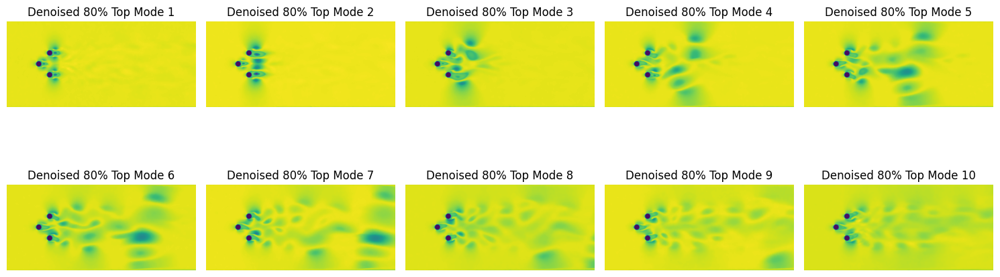

In [395]:
U_reduced = U[:, :k_threshold]
S_reduced = np.diag(S[:k_threshold])
Vt_reduced = Vt[:k_threshold, :]
reconstructed_images = U_reduced @ S_reduced @ Vt_reduced + mean_image

plt.figure(figsize=(15, 6))
for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.imshow(reconstructed_images[i].reshape(images[0].shape), cmap=None)
    plt.title(f"Denoised 80% Top Mode {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()

In [396]:
# Total Energy of all modes
total_energy = np.sum(S[:k_threshold] ** 2)

# Total Energy of 10 modes
total_energy_top_10_modes = np.sum(S[:10] ** 2)

# % Contribution by 10 modes in total energy
percentage_energy_top_10_modes = (total_energy_top_10_modes / total_energy) * 100
print(f"Total energy: {total_energy}")
print(f"Sum of top 10 singular values: {total_energy_top_10_modes}")
print(f"Percentage of total energy contribution by the top 10 modes: {percentage_energy_top_10_modes:.2f}%")

Total energy: 4327275518.353409
Sum of top 10 singular values: 2667033999.4741983
Percentage of total energy contribution by the top 10 modes: 61.63%


In [397]:
# Individual energy of 10 modes
energy_first_10_modes = (S[:10] ** 2)
total_energy = np.sum(S[:k_threshold] ** 2)


for i, energy in enumerate(energy_first_10_modes, start=1):
    print(f"Energy contribution of mode {i}: {(energy_first_10_modes[i-1]/total_energy)*100:.2f}%")


Energy contribution of mode 1: 10.56%
Energy contribution of mode 2: 8.47%
Energy contribution of mode 3: 7.73%
Energy contribution of mode 4: 7.34%
Energy contribution of mode 5: 5.91%
Energy contribution of mode 6: 5.22%
Energy contribution of mode 7: 4.90%
Energy contribution of mode 8: 4.08%
Energy contribution of mode 9: 3.82%
Energy contribution of mode 10: 3.60%


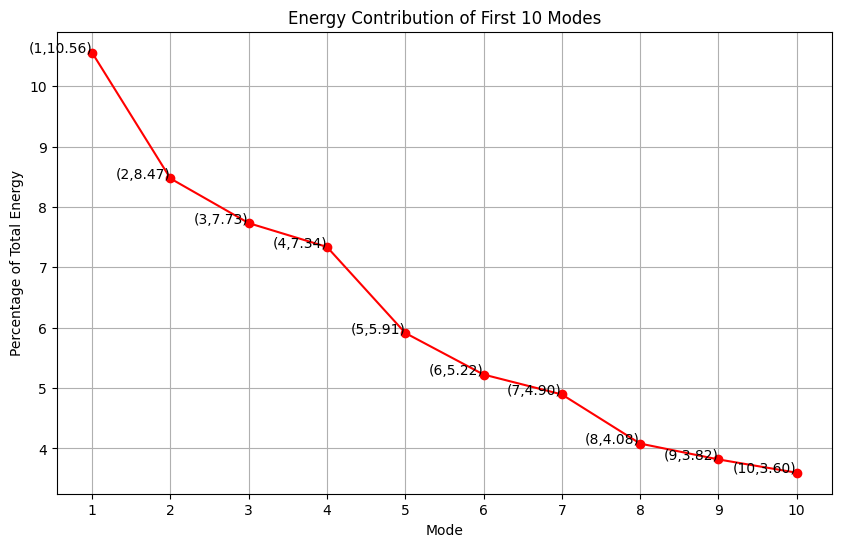

In [398]:
plot_energy_contribution_first_10_modes(energy_first_10_modes, total_energy)

**POD on 60% noise removed using NLM**

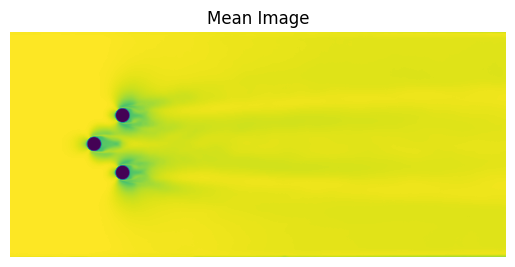

In [399]:
folder_path = "/content/denoised_images_NLM_60"

images = load_and_preprocess_images(folder_path)

stacked_images = stack_images(images)

mean_image = np.mean(stacked_images, axis=0)

mean_image_reshaped = mean_image.reshape(images[0].shape)

plt.imshow(mean_image_reshaped)
plt.title('Mean Image')
plt.axis('off')
plt.show()

mean_subtracted_images = stacked_images - mean_image

U, S, Vt = np.linalg.svd(mean_subtracted_images, full_matrices=False)

num_modes = 10
dominant_modes = Vt[:num_modes, :]

temporal_coefficients = np.dot(dominant_modes, mean_subtracted_images.T)

reconstructed_images = np.dot(temporal_coefficients.T, dominant_modes) + mean_image



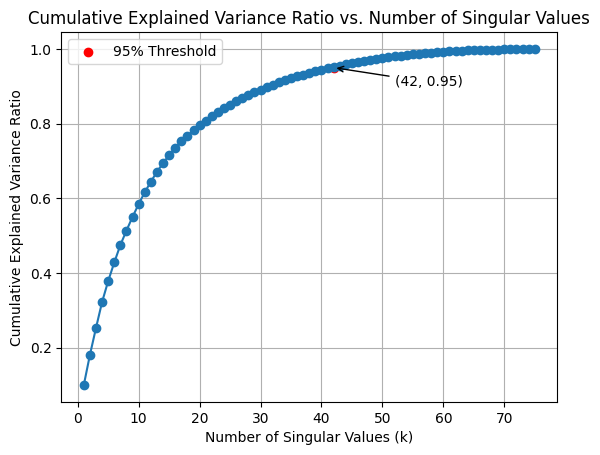

The smallest k that captures 95% of the total variance: 42


In [400]:
k_threshold = plot_cumulative_variance_ratio(S)

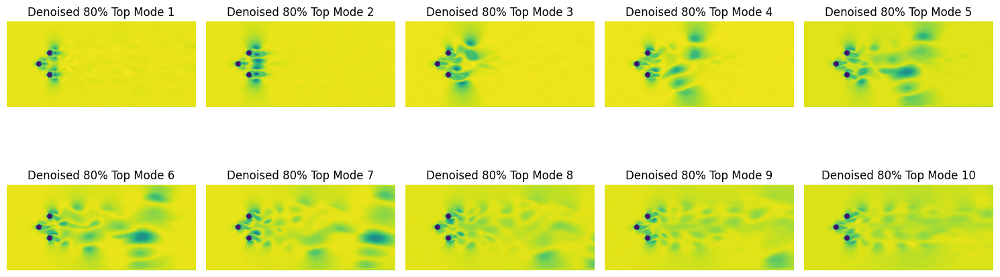

In [401]:
U_reduced = U[:, :k_threshold]
S_reduced = np.diag(S[:k_threshold])
Vt_reduced = Vt[:k_threshold, :]
reconstructed_images = U_reduced @ S_reduced @ Vt_reduced + mean_image

plt.figure(figsize=(15, 6))
for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.imshow(reconstructed_images[i].reshape(images[0].shape), cmap=None)
    plt.title(f"Denoised 80% Top Mode {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()

In [402]:
# Total Energy of all modes
total_energy = np.sum(S[:k_threshold] ** 2)

# Total Energy of 10 modes
total_energy_top_10_modes = np.sum(S[:10] ** 2)

# % Contribution by 10 modes in total energy
percentage_energy_top_10_modes = (total_energy_top_10_modes / total_energy) * 100
print(f"Total energy: {total_energy}")
print(f"Sum of top 10 singular values: {total_energy_top_10_modes}")
print(f"Percentage of total energy contribution by the top 10 modes: {percentage_energy_top_10_modes:.2f}%")

Total energy: 4240890261.4318275
Sum of top 10 singular values: 2604875905.949611
Percentage of total energy contribution by the top 10 modes: 61.42%


In [403]:
# Individual energy of 10 modes
energy_first_10_modes = (S[:10] ** 2)
total_energy = np.sum(S[:k_threshold] ** 2)


for i, energy in enumerate(energy_first_10_modes, start=1):
    print(f"Energy contribution of mode {i}: {(energy_first_10_modes[i-1]/total_energy)*100:.2f}%")


Energy contribution of mode 1: 10.53%
Energy contribution of mode 2: 8.44%
Energy contribution of mode 3: 7.61%
Energy contribution of mode 4: 7.29%
Energy contribution of mode 5: 5.89%
Energy contribution of mode 6: 5.24%
Energy contribution of mode 7: 4.90%
Energy contribution of mode 8: 4.08%
Energy contribution of mode 9: 3.84%
Energy contribution of mode 10: 3.60%


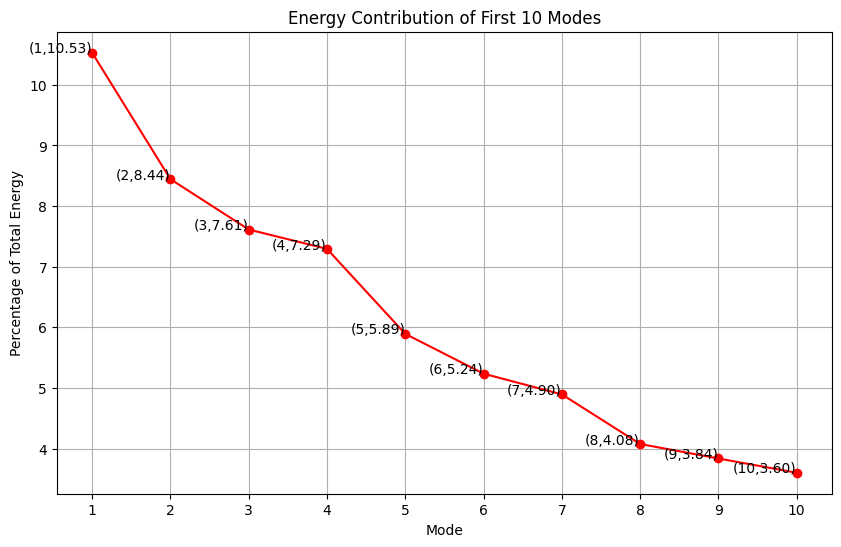

In [404]:
plot_energy_contribution_first_10_modes(energy_first_10_modes, total_energy)

**POD on 80% noise removed using NLM**

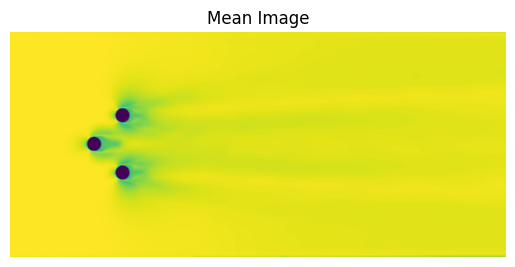

In [405]:
folder_path = "/content/denoised_images_NLM_80"

images = load_and_preprocess_images(folder_path)

stacked_images = stack_images(images)

mean_image = np.mean(stacked_images, axis=0)

mean_image_reshaped = mean_image.reshape(images[0].shape)

plt.imshow(mean_image_reshaped)
plt.title('Mean Image')
plt.axis('off')
plt.show()

mean_subtracted_images = stacked_images - mean_image

U, S, Vt = np.linalg.svd(mean_subtracted_images, full_matrices=False)

num_modes = 10
dominant_modes = Vt[:num_modes, :]

temporal_coefficients = np.dot(dominant_modes, mean_subtracted_images.T)

reconstructed_images = np.dot(temporal_coefficients.T, dominant_modes) + mean_image



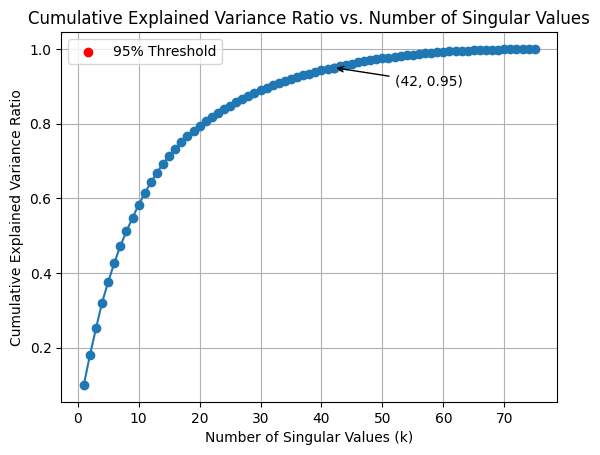

The smallest k that captures 95% of the total variance: 42


In [406]:
k_threshold = plot_cumulative_variance_ratio(S)

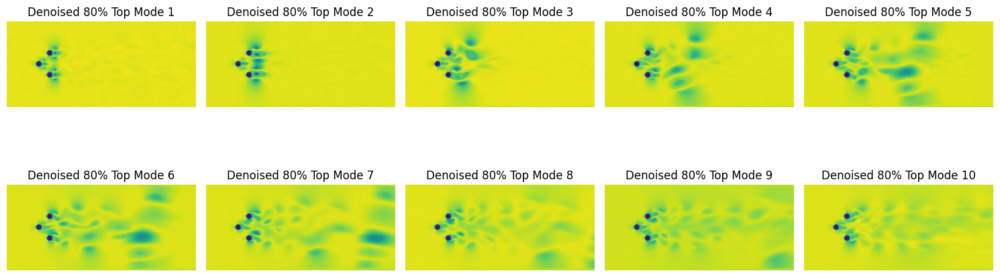

In [407]:
U_reduced = U[:, :k_threshold]
S_reduced = np.diag(S[:k_threshold])
Vt_reduced = Vt[:k_threshold, :]
reconstructed_images = U_reduced @ S_reduced @ Vt_reduced + mean_image

plt.figure(figsize=(15, 6))
for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.imshow(reconstructed_images[i].reshape(images[0].shape), cmap=None)
    plt.title(f"Denoised 80% Top Mode {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()

In [408]:
# Total Energy of all modes
total_energy = np.sum(S[:k_threshold] ** 2)

# Total Energy of 10 modes
total_energy_top_10_modes = np.sum(S[:10] ** 2)

# % Contribution by 10 modes in total energy
percentage_energy_top_10_modes = (total_energy_top_10_modes / total_energy) * 100
print(f"Total energy: {total_energy}")
print(f"Sum of top 10 singular values: {total_energy_top_10_modes}")
print(f"Percentage of total energy contribution by the top 10 modes: {percentage_energy_top_10_modes:.2f}%")

Total energy: 4182457197.044701
Sum of top 10 singular values: 2563667942.5503383
Percentage of total energy contribution by the top 10 modes: 61.30%


In [409]:
# Individual energy of 10 modes
energy_first_10_modes = (S[:10] ** 2)
total_energy = np.sum(S[:k_threshold] ** 2)


for i, energy in enumerate(energy_first_10_modes, start=1):
    print(f"Energy contribution of mode {i}: {(energy_first_10_modes[i-1]/total_energy)*100:.2f}%")


Energy contribution of mode 1: 10.51%
Energy contribution of mode 2: 8.41%
Energy contribution of mode 3: 7.56%
Energy contribution of mode 4: 7.26%
Energy contribution of mode 5: 5.87%
Energy contribution of mode 6: 5.24%
Energy contribution of mode 7: 4.90%
Energy contribution of mode 8: 4.08%
Energy contribution of mode 9: 3.85%
Energy contribution of mode 10: 3.61%


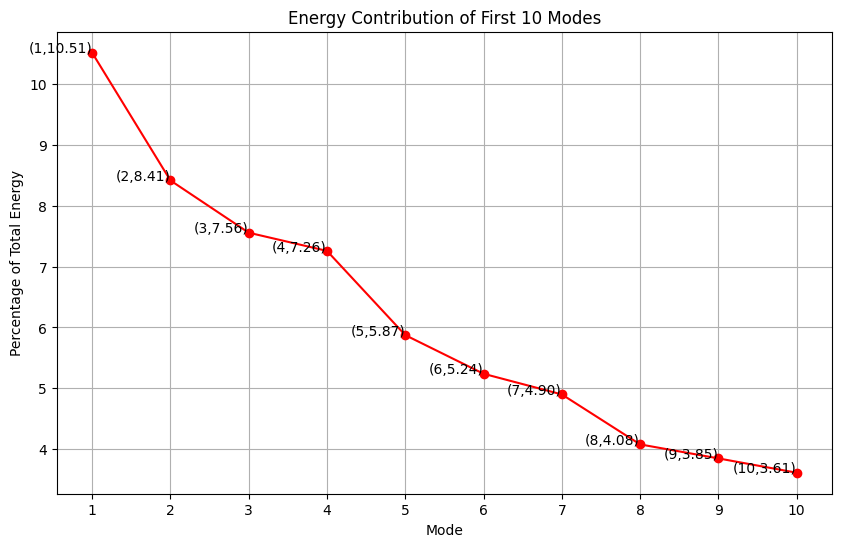

In [410]:
plot_energy_contribution_first_10_modes(energy_first_10_modes, total_energy)